
DEEP LEARNING FOR ROAD NETWORK EXTRACTION FROM AERIAL IMAGERY

Author : Sairam Jammu

Dataset : Massachusetts Roads Dataset (Kaggle)

Models  : U-Net, DeepLabV3+, PSPNet, FPN, YOLOv8-Seg

# SECTION 1: ENVIRONMENT SETUP & INSTALLATION

In [ ]:
# Install required packages
!!pip install -q kaggle segmentation-models-pytorch albumentations ultralytics


[]

# SECTION 2: IMPORT LIBRARIES


In [ ]:
print("\n" + "="*80)
print("SECTION 2: IMPORTING LIBRARIES")
print("="*80)

import os
import glob
import time
import copy
import io
from datetime import datetime

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image

from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau

import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2

from ultralytics import YOLO

from tqdm import tqdm
from google.colab import files

import warnings
warnings.filterwarnings("ignore")
sns.set_style("whitegrid")

print(" Libraries imported successfully!")
print(f"PyTorch Version : {torch.__version__}")
print(f"CUDA Available  : {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA Device     : {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory      : {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"\n Using device: {device}")



SECTION 2: IMPORTING LIBRARIES
 Libraries imported successfully!
PyTorch Version : 2.9.0+cu126
CUDA Available  : True
CUDA Device     : NVIDIA A100-SXM4-80GB
GPU Memory      : 85.17 GB

 Using device: cuda


# SECTION 3: KAGGLE API SETUP & DATASET DOWNLOAD


In [ ]:
print("\n" + "="*80)
print("SECTION 3: KAGGLE API SETUP & DATASET DOWNLOAD")
print("="*80)

print("\n📤 Please upload your kaggle.json file (API token):")
uploaded = files.upload()

if "kaggle.json" not in uploaded:
    raise RuntimeError("kaggle.json not uploaded. Please upload and re-run this cell.")

!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
print("Kaggle credentials configured!")

!mkdir -p /content/data

print("\n Downloading Massachusetts Roads Dataset from Kaggle...")
!kaggle datasets download -d balraj98/massachusetts-roads-dataset -p /content/data --unzip
print(" Dataset downloaded and extracted!")

data_path = "/content/data/mass_roads"


SECTION 3: KAGGLE API SETUP & DATASET DOWNLOAD

📤 Please upload your kaggle.json file (API token):


Saving kaggle.json to kaggle.json
Kaggle credentials configured!

Dataset URL: https://www.kaggle.com/datasets/balraj98/massachusetts-roads-dataset
License(s): other
100% 5.75G/5.76G [00:15<00:00, 956MB/s] 
100% 5.76G/5.76G [00:15<00:00, 403MB/s]
 Dataset downloaded and extracted!


# SECTION 4: DATASET EXPLORATION & VISUALIZATION



SECTION 4: DATASET EXPLORATION & VISUALIZATION

 DATASET STATISTICS:
  Training samples   : 1108
  Validation samples : 14
  Test samples       : 49
  Total samples      : 1171

Verification of pairing:
  Train: 1108 images, 1108 masks
  Val  : 14 images,   14 masks
  Test : 49 images,  49 masks

 Sample visualizations from training set:


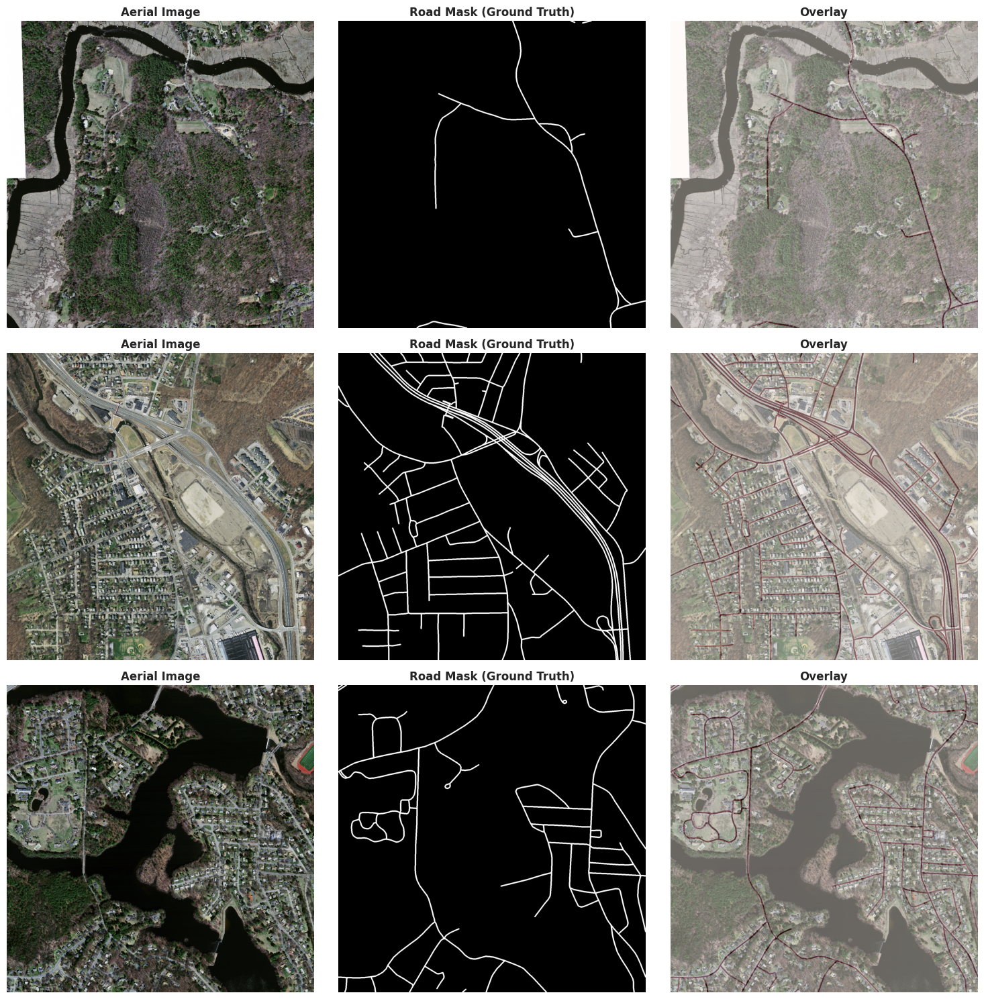


 ROAD COVERAGE ANALYSIS (sampled):
  Mean   : 4.89%
  Median : 4.85%
  Min    : 0.14%
  Max    : 9.93%


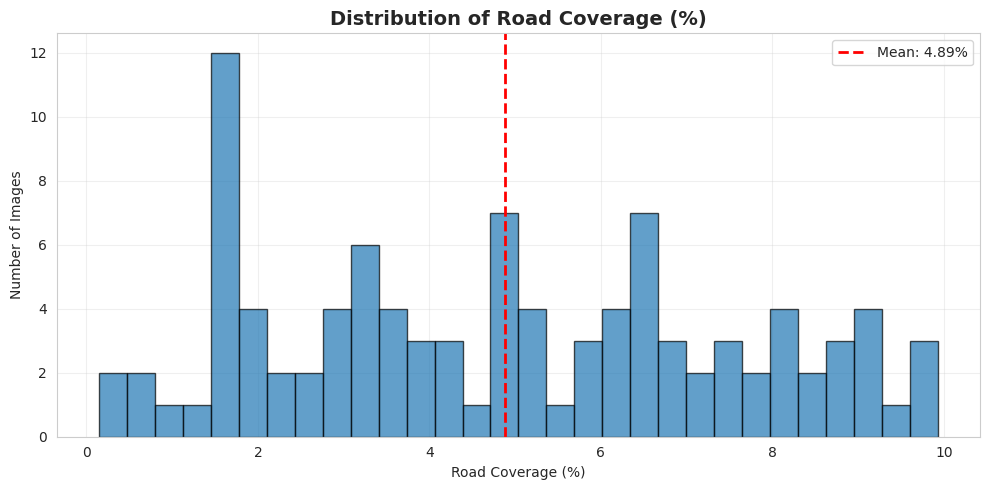

In [ ]:
print("\n" + "="*80)
print("SECTION 4: DATASET EXPLORATION & VISUALIZATION")
print("="*80)

train_images_dir = os.path.join(data_path, "train")
train_labels_dir = os.path.join(data_path, "train_labels")
val_images_dir   = os.path.join(data_path, "val")
val_labels_dir   = os.path.join(data_path, "val_labels")
test_images_dir  = os.path.join(data_path, "test")
test_labels_dir  = os.path.join(data_path, "test_labels")

train_images = sorted(glob.glob(os.path.join(train_images_dir, "*.tif*")))
train_masks  = sorted(glob.glob(os.path.join(train_labels_dir, "*.tif*")))
val_images   = sorted(glob.glob(os.path.join(val_images_dir, "*.tif*")))
val_masks    = sorted(glob.glob(os.path.join(val_labels_dir, "*.tif*")))
test_images  = sorted(glob.glob(os.path.join(test_images_dir, "*.tif*")))
test_masks   = sorted(glob.glob(os.path.join(test_labels_dir, "*.tif*")))

print("\n DATASET STATISTICS:")
print(f"  Training samples   : {len(train_images)}")
print(f"  Validation samples : {len(val_images)}")
print(f"  Test samples       : {len(test_images)}")
print(f"  Total samples      : {len(train_images) + len(val_images) + len(test_images)}")

print("\nVerification of pairing:")
print(f"  Train: {len(train_images)} images, {len(train_masks)} masks")
print(f"  Val  : {len(val_images)} images,   {len(val_masks)} masks")
print(f"  Test : {len(test_images)} images,  {len(test_masks)} masks")


def visualize_samples(image_dir, label_dir, n_samples=3):
    """Visualize random image-mask pairs."""
    image_files = sorted(glob.glob(os.path.join(image_dir, "*.tif*")))
    label_files = sorted(glob.glob(os.path.join(label_dir, "*.tif*")))

    if len(image_files) == 0:
        print(" No images found for visualization.")
        return

    n_samples = min(n_samples, len(image_files))
    idxs = np.random.choice(len(image_files), n_samples, replace=False)

    fig, axes = plt.subplots(n_samples, 3, figsize=(15, 5 * n_samples))
    if n_samples == 1:
        axes = axes.reshape(1, -1)

    for row, i in enumerate(idxs):
        img = cv2.imread(image_files[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(label_files[i], cv2.IMREAD_GRAYSCALE)

        axes[row, 0].imshow(img)
        axes[row, 0].set_title("Aerial Image", fontsize=12, fontweight="bold")
        axes[row, 0].axis("off")

        axes[row, 1].imshow(mask, cmap="gray")
        axes[row, 1].set_title("Road Mask (Ground Truth)", fontsize=12, fontweight="bold")
        axes[row, 1].axis("off")

        axes[row, 2].imshow(img)
        axes[row, 2].imshow(mask, cmap="Reds", alpha=0.4)
        axes[row, 2].set_title("Overlay", fontsize=12, fontweight="bold")
        axes[row, 2].axis("off")

    plt.tight_layout()
    plt.show()


def analyze_road_coverage(label_dir, n_samples=100):
    """Compute road pixel coverage distribution."""
    label_files = sorted(glob.glob(os.path.join(label_dir, "*.tif*")))
    if len(label_files) == 0:
        print(" No labels found for coverage analysis.")
        return []

    sample_files = label_files[: min(n_samples, len(label_files))]
    road_pct_list = []

    for path in sample_files:
        mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        road_pixels = np.sum(mask > 127)
        total_pixels = mask.size
        road_pct = (road_pixels / total_pixels) * 100
        road_pct_list.append(road_pct)

    print("\n ROAD COVERAGE ANALYSIS (sampled):")
    print(f"  Mean   : {np.mean(road_pct_list):.2f}%")
    print(f"  Median : {np.median(road_pct_list):.2f}%")
    print(f"  Min    : {np.min(road_pct_list):.2f}%")
    print(f"  Max    : {np.max(road_pct_list):.2f}%")

    plt.figure(figsize=(10, 5))
    plt.hist(road_pct_list, bins=30, edgecolor="black", alpha=0.7)
    plt.axvline(np.mean(road_pct_list), color="red", linestyle="--", linewidth=2,
                label=f"Mean: {np.mean(road_pct_list):.2f}%")
    plt.title("Distribution of Road Coverage (%)", fontsize=14, fontweight="bold")
    plt.xlabel("Road Coverage (%)")
    plt.ylabel("Number of Images")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    return road_pct_list


print("\n Sample visualizations from training set:")
visualize_samples(train_images_dir, train_labels_dir, n_samples=3)

road_coverage = analyze_road_coverage(train_labels_dir)


# SECTION 5: CUSTOM DATASET & TRANSFORMS


In [ ]:
print("\n" + "="*80)
print("SECTION 5: CUSTOM DATASET & TRANSFORMS")
print("="*80)

class RoadSegmentationDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        assert len(image_paths) == len(mask_paths), "Image/mask count mismatch."
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = cv2.imread(self.image_paths[idx])
        if img is None:
            raise ValueError(f"Failed to read image {self.image_paths[idx]}")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(self.mask_paths[idx], cv2.IMREAD_GRAYSCALE)
        if mask is None:
            raise ValueError(f"Failed to read mask {self.mask_paths[idx]}")
        mask = (mask > 127).astype(np.float32)

        if self.transform is not None:
            aug = self.transform(image=img, mask=mask)
            img = aug["image"]
            mask = aug["mask"]

        return img, mask


IMG_SIZE   = 256
BATCH_SIZE = 8
NUM_WORKERS = 2

print(f"\n Config: IMG_SIZE={IMG_SIZE}, BATCH_SIZE={BATCH_SIZE}, WORKERS={NUM_WORKERS}")

train_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=45, p=0.5),
    A.OneOf([
        A.GaussNoise(var_limit=(10, 50), p=1.0),
        A.GaussianBlur(blur_limit=(3, 7), p=1.0),
    ], p=0.3),
    A.OneOf([
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=1.0),
        A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=1.0),
    ], p=0.3),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

val_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

train_dataset = RoadSegmentationDataset(train_images, train_masks, transform=train_transform)
val_dataset   = RoadSegmentationDataset(val_images,   val_masks,   transform=val_transform)
test_dataset  = RoadSegmentationDataset(test_images,  test_masks,  transform=val_transform)

print("\n Dataset sizes:")
print(f"  Train : {len(train_dataset)}")
print(f"  Val   : {len(val_dataset)}")
print(f"  Test  : {len(test_dataset)}")

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)

print("\n DataLoaders created.")


SECTION 5: CUSTOM DATASET & TRANSFORMS

 Config: IMG_SIZE=256, BATCH_SIZE=8, WORKERS=2

 Dataset sizes:
  Train : 1108
  Val   : 14
  Test  : 49

 DataLoaders created.


# SECTION 6: CLASS DISTRIBUTION & POSITIVE WEIGHT


In [ ]:
def calculate_class_distribution(dataloader, n_batches=20):
    road_pixels = 0
    total_pixels = 0

    for i, (_, masks) in enumerate(tqdm(dataloader, total=n_batches,
                                        desc="Analyzing class distribution")):
        if i >= n_batches:
            break
        road_pixels += masks.sum().item()
        total_pixels += masks.numel()

    if total_pixels == 0 or road_pixels == 0:
        return 0.01, 0.99

    road_ratio = road_pixels / total_pixels
    non_road_ratio = 1.0 - road_ratio
    return road_ratio, non_road_ratio


road_ratio, non_road_ratio = calculate_class_distribution(train_loader)

print("\n CLASS DISTRIBUTION ESTIMATE:")
print(f"  Road pixels     : {road_ratio*100:.2f}%")
print(f"  Non-road pixels : {non_road_ratio*100:.2f}%")
print(f"  Imbalance ratio : 1 : {non_road_ratio/road_ratio:.2f}")

pos_weight = torch.tensor([non_road_ratio / max(road_ratio, 1e-6)], dtype=torch.float32)
print(f"  Positive weight : {pos_weight.item():.4f}")



Analyzing class distribution: 100%|██████████| 20/20 [00:02<00:00,  9.38it/s]


 CLASS DISTRIBUTION ESTIMATE:
  Road pixels     : 4.74%
  Non-road pixels : 95.26%
  Imbalance ratio : 1 : 20.08
  Positive weight : 20.0780


# SECTION 7: MODEL ARCHITECTURES


In [ ]:
print("\n" + "="*80)
print("SECTION 7: MODEL ARCHITECTURES")
print("="*80)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


# ----- 7.1 U-NET (custom) -----
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.double_conv(x)


class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, features=(64, 128, 256, 512)):
        super().__init__()
        self.encoder = nn.ModuleList()
        self.pool = nn.MaxPool2d(2, 2)
        ch = in_channels
        for f in features:
            self.encoder.append(DoubleConv(ch, f))
            ch = f

        self.bottleneck = DoubleConv(features[-1], features[-1]*2)

        self.decoder = nn.ModuleList()
        for f in reversed(features):
            self.decoder.append(nn.ConvTranspose2d(f*2, f, kernel_size=2, stride=2))
            self.decoder.append(DoubleConv(f*2, f))

        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x):
        skips = []
        for block in self.encoder:
            x = block(x)
            skips.append(x)
            x = self.pool(x)

        x = self.bottleneck(x)
        skips = skips[::-1]

        for idx in range(0, len(self.decoder), 2):
            x = self.decoder[idx](x)
            skip = skips[idx//2]
            if x.shape != skip.shape:
                x = nn.functional.interpolate(x, size=skip.shape[2:])
            x = torch.cat((skip, x), dim=1)
            x = self.decoder[idx+1](x)

        return self.final_conv(x)


unet_model = UNet(in_channels=3, out_channels=1).to(device)
unet_params = count_parameters(unet_model)
print(f"U-Net created | Params: {unet_params:,} (~{unet_params*4/(1024**2):.2f} MB)")


# ----- 7.2 DeepLabV3+ -----
deeplab_model = smp.DeepLabV3Plus(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation=None,
).to(device)
deeplab_params = count_parameters(deeplab_model)
print(f" DeepLabV3+ created | Params: {deeplab_params:,} (~{deeplab_params*4/(1024**2):.2f} MB)")


# ----- 7.3 PSPNet -----
pspnet_model = smp.PSPNet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation=None,
).to(device)
pspnet_params = count_parameters(pspnet_model)
print(f" PSPNet created | Params: {pspnet_params:,} (~{pspnet_params*4/(1024**2):.2f} MB)")


# ----- 7.4 FPN -----
fpn_model = smp.FPN(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation=None,
).to(device)
fpn_params = count_parameters(fpn_model)
print(f" FPN created | Params: {fpn_params:,} (~{fpn_params*4/(1024**2):.2f} MB)")


# ----- 7.5 YOLOv8-Seg hook -----
print("\n" + "-"*80)
print("YOLOv8-Seg: instance segmentation hook (optional)")
print("-"*80)

YOLO_WEIGHTS_PATH = "/content/runs/segment/road_segmentation_yolo/weights/best.pt"
if os.path.exists(YOLO_WEIGHTS_PATH):
    yolo_model = YOLO(YOLO_WEIGHTS_PATH)
    YOLO_AVAILABLE = True
    print(f" YOLOv8-Seg loaded from: {YOLO_WEIGHTS_PATH}")
else:
    yolo_model = None
    YOLO_AVAILABLE = False
    print(" YOLO weights not found. Train YOLO separately and update YOLO_WEIGHTS_PATH.")




SECTION 7: MODEL ARCHITECTURES
U-Net created | Params: 31,037,633 (~118.40 MB)
 DeepLabV3+ created | Params: 22,437,457 (~85.59 MB)
 PSPNet created | Params: 21,437,985 (~81.78 MB)
 FPN created | Params: 23,155,393 (~88.33 MB)

--------------------------------------------------------------------------------
YOLOv8-Seg: instance segmentation hook (optional)
--------------------------------------------------------------------------------
 YOLO weights not found. Train YOLO separately and update YOLO_WEIGHTS_PATH.


# SECTION 8: LOSS FUNCTIONS & METRICS


In [ ]:
print("\n" + "="*80)
print("SECTION 8: LOSS FUNCTIONS & METRICS")
print("="*80)

class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth

    def forward(self, logits, targets):
        probs = torch.sigmoid(logits)
        probs = probs.view(-1)
        targets = targets.view(-1)
        intersection = (probs * targets).sum()
        dice = (2*intersection + self.smooth) / (
            probs.sum() + targets.sum() + self.smooth
        )
        return 1.0 - dice


class CombinedLoss(nn.Module):
    def __init__(self, pos_weight=None, bce_weight=0.5, dice_weight=0.5):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
        self.dice = DiceLoss()
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight

    def forward(self, logits, targets):
        bce_loss = self.bce(logits, targets)
        dice_loss = self.dice(logits, targets)
        return self.bce_weight * bce_loss + self.dice_weight * dice_loss


def calculate_metrics(logits, targets, threshold=0.5):
    probs = torch.sigmoid(logits)
    preds = (probs > threshold).float()

    tp = (preds * targets).sum()
    fp = (preds * (1 - targets)).sum()
    fn = ((1 - preds) * targets).sum()

    precision = (tp + 1e-6) / (tp + fp + 1e-6)
    recall    = (tp + 1e-6) / (tp + fn + 1e-6)
    f1        = 2 * precision * recall / (precision + recall + 1e-6)

    intersection = tp
    union = tp + fp + fn
    iou = (intersection + 1e-6) / (union + 1e-6)

    return {
        "iou":        iou.item(),
        "f1":         f1.item(),
        "precision":  precision.item(),
        "recall":     recall.item(),
    }


print(" Losses & metrics ready: Dice, Combined(BCE+Dice), IoU, F1, Precision, Recall")




SECTION 8: LOSS FUNCTIONS & METRICS
 Losses & metrics ready: Dice, Combined(BCE+Dice), IoU, F1, Precision, Recall


# SECTION 9: TRAINING PIPELINE


In [ ]:
print("\n" + "="*80)
print("SECTION 9: TRAINING PIPELINE")
print("="*80)

def train_one_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    running_iou = 0.0

    with tqdm(dataloader, desc="Training", leave=False) as pbar:
        for imgs, masks in pbar:
            imgs = imgs.to(device)
            masks = masks.unsqueeze(1).to(device)

            optimizer.zero_grad()
            logits = model(imgs)
            loss = criterion(logits, masks)
            loss.backward()
            optimizer.step()

            iou = calculate_metrics(logits, masks)["iou"]

            running_loss += loss.item()
            running_iou  += iou

            pbar.set_postfix({"loss": f"{loss.item():.4f}", "iou": f"{iou:.4f}"})

    epoch_loss = running_loss / len(dataloader)
    epoch_iou  = running_iou  / len(dataloader)
    return epoch_loss, epoch_iou


def validate(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    agg_metrics = {"iou": 0.0, "f1": 0.0, "precision": 0.0, "recall": 0.0}

    with torch.no_grad():
        with tqdm(dataloader, desc="Validation", leave=False) as pbar:
            for imgs, masks in pbar:
                imgs = imgs.to(device)
                masks = masks.unsqueeze(1).to(device)

                logits = model(imgs)
                loss = criterion(logits, masks)
                metrics = calculate_metrics(logits, masks)

                running_loss += loss.item()
                for k in agg_metrics:
                    agg_metrics[k] += metrics[k]

                pbar.set_postfix({"loss": f"{loss.item():.4f}", "iou": f"{metrics['iou']:.4f}"})

    epoch_loss = running_loss / len(dataloader)
    for k in agg_metrics:
        agg_metrics[k] /= len(dataloader)

    return epoch_loss, agg_metrics


def train_model(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler,
    num_epochs,
    device,
    checkpoint_dir,
    early_stop_patience=10,
    model_name="Model",
):
    os.makedirs(checkpoint_dir, exist_ok=True)

    print("\n" + "="*80)
    print(f"TRAINING {model_name.upper()}")
    print("="*80)
    print(f"Device    : {device}")
    print(f"Start time: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

    best_val_iou = 0.0
    best_wts = copy.deepcopy(model.state_dict())
    epochs_no_improve = 0

    history = {
        "train_loss": [], "train_iou": [],
        "val_loss": [],   "val_iou": [],
        "val_f1": [], "val_precision": [], "val_recall": [],
        "learning_rates": [],
    }

    for epoch in range(num_epochs):
        epoch_start = time.time()
        print(f"\nEpoch {epoch+1}/{num_epochs}")
        print("-"*80)

        train_loss, train_iou = train_one_epoch(model, train_loader, criterion, optimizer, device)
        val_loss, val_metrics = validate(model, val_loader, criterion, device)

        scheduler.step(val_loss)
        lr = optimizer.param_groups[0]["lr"]

        history["train_loss"].append(train_loss)
        history["train_iou"].append(train_iou)
        history["val_loss"].append(val_loss)
        history["val_iou"].append(val_metrics["iou"])
        history["val_f1"].append(val_metrics["f1"])
        history["val_precision"].append(val_metrics["precision"])
        history["val_recall"].append(val_metrics["recall"])
        history["learning_rates"].append(lr)

        epoch_time = time.time() - epoch_start
        print(f"Time: {epoch_time:.2f}s")
        print(f"Train Loss: {train_loss:.4f} | Train IoU: {train_iou:.4f}")
        print(f"Val   Loss: {val_loss:.4f} | Val   IoU: {val_metrics['iou']:.4f}")
        print(f"Val F1: {val_metrics['f1']:.4f}, Prec: {val_metrics['precision']:.4f}, "
              f"Rec: {val_metrics['recall']:.4f}")
        print(f"LR: {lr:.2e}")

        if val_metrics["iou"] > best_val_iou:
            best_val_iou = val_metrics["iou"]
            best_wts = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0

            ckpt_path = os.path.join(checkpoint_dir, f"best_{model_name.lower().replace(' ', '_')}.pth")
            torch.save({
                "epoch": epoch+1,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "val_iou": best_val_iou,
                "history": history,
            }, ckpt_path)
            print(f" New best model saved! (Val IoU: {best_val_iou:.4f})")
        else:
            epochs_no_improve += 1
            print(f"No improvement for {epochs_no_improve} epoch(s)")

        if epochs_no_improve >= early_stop_patience:
            print("\nEarly stopping triggered.")
            break

    model.load_state_dict(best_wts)

    print("\n" + "="*80)
    print(f"{model_name.upper()} TRAINING COMPLETE")
    print(f"Best Val IoU: {best_val_iou:.4f}")
    print("="*80)

    return model, history


def plot_training_history(history, model_name="Model"):
    epochs = range(1, len(history["train_loss"]) + 1)
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))

    axes[0, 0].plot(epochs, history["train_loss"], label="Train")
    axes[0, 0].plot(epochs, history["val_loss"],   label="Val")
    axes[0, 0].set_title("Loss"); axes[0, 0].set_xlabel("Epoch"); axes[0, 0].set_ylabel("Loss"); axes[0, 0].legend(); axes[0, 0].grid(alpha=0.3)

    axes[0, 1].plot(epochs, history["train_iou"], label="Train")
    axes[0, 1].plot(epochs, history["val_iou"],   label="Val")
    axes[0, 1].set_title("IoU"); axes[0, 1].set_xlabel("Epoch"); axes[0, 1].set_ylabel("IoU"); axes[0, 1].legend(); axes[0, 1].grid(alpha=0.3)

    axes[0, 2].plot(epochs, history["val_f1"])
    axes[0, 2].set_title("F1 (Val)"); axes[0, 2].set_xlabel("Epoch"); axes[0, 2].set_ylabel("F1"); axes[0, 2].grid(alpha=0.3)

    axes[1, 0].plot(epochs, history["val_precision"])
    axes[1, 0].set_title("Precision (Val)"); axes[1, 0].set_xlabel("Epoch"); axes[1, 0].set_ylabel("Precision"); axes[1, 0].grid(alpha=0.3)

    axes[1, 1].plot(epochs, history["val_recall"])
    axes[1, 1].set_title("Recall (Val)"); axes[1, 1].set_xlabel("Epoch"); axes[1, 1].set_ylabel("Recall"); axes[1, 1].grid(alpha=0.3)

    axes[1, 2].plot(epochs, history["learning_rates"])
    axes[1, 2].set_title("Learning Rate"); axes[1, 2].set_xlabel("Epoch"); axes[1, 2].set_ylabel("LR"); axes[1, 2].set_yscale("log"); axes[1, 2].grid(alpha=0.3)

    plt.suptitle(f"{model_name} - Training History", fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.show()


print(" Training, validation & plotting pipeline defined.")



SECTION 9: TRAINING PIPELINE
 Training, validation & plotting pipeline defined.


# SECTION 10: TRAIN ALL ENCODER–DECODER MODELS



SECTION 10: TRAINING ALL MODELS
Checkpoints will be saved in: /content/checkpoints

10.1 TRAINING U-NET

TRAINING U-NET
Device    : cuda
Start time: 2025-12-04 09:38:43

Epoch 1/30
--------------------------------------------------------------------------------


Time: 12.52s
Train Loss: 0.9739 | Train IoU: 0.0991
Val   Loss: 0.9712 | Val   IoU: 0.1366
Val F1: 0.2402, Prec: 0.1391, Rec: 0.8878
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1366)

Epoch 2/30
--------------------------------------------------------------------------------


Time: 11.96s
Train Loss: 0.9104 | Train IoU: 0.1276
Val   Loss: 0.9043 | Val   IoU: 0.1708
Val F1: 0.2916, Prec: 0.1759, Rec: 0.8624
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1708)

Epoch 3/30
--------------------------------------------------------------------------------


Time: 11.75s
Train Loss: 0.8797 | Train IoU: 0.1423
Val   Loss: 0.8915 | Val   IoU: 0.1510
Val F1: 0.2623, Prec: 0.1530, Rec: 0.9244
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 4/30
--------------------------------------------------------------------------------


Time: 11.77s
Train Loss: 0.8541 | Train IoU: 0.1593
Val   Loss: 0.8399 | Val   IoU: 0.2004
Val F1: 0.3337, Prec: 0.2070, Rec: 0.8660
LR: 1.00e-04
 New best model saved! (Val IoU: 0.2004)

Epoch 5/30
--------------------------------------------------------------------------------


Time: 11.84s
Train Loss: 0.8336 | Train IoU: 0.1705
Val   Loss: 0.8196 | Val   IoU: 0.1931
Val F1: 0.3236, Prec: 0.1975, Rec: 0.8983
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 6/30
--------------------------------------------------------------------------------


Time: 11.92s
Train Loss: 0.8255 | Train IoU: 0.1768
Val   Loss: 0.8079 | Val   IoU: 0.2126
Val F1: 0.3506, Prec: 0.2190, Rec: 0.8801
LR: 1.00e-04
 New best model saved! (Val IoU: 0.2126)

Epoch 7/30
--------------------------------------------------------------------------------


Time: 11.99s
Train Loss: 0.8151 | Train IoU: 0.1830
Val   Loss: 0.7821 | Val   IoU: 0.2310
Val F1: 0.3752, Prec: 0.2389, Rec: 0.8764
LR: 1.00e-04
 New best model saved! (Val IoU: 0.2310)

Epoch 8/30
--------------------------------------------------------------------------------


Time: 11.98s
Train Loss: 0.7984 | Train IoU: 0.1919
Val   Loss: 0.7815 | Val   IoU: 0.2624
Val F1: 0.4157, Prec: 0.2764, Rec: 0.8395
LR: 1.00e-04
 New best model saved! (Val IoU: 0.2624)

Epoch 9/30
--------------------------------------------------------------------------------


Time: 11.86s
Train Loss: 0.7972 | Train IoU: 0.1960
Val   Loss: 0.7605 | Val   IoU: 0.2435
Val F1: 0.3916, Prec: 0.2524, Rec: 0.8745
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 10/30
--------------------------------------------------------------------------------


Time: 11.89s
Train Loss: 0.7917 | Train IoU: 0.1994
Val   Loss: 0.7615 | Val   IoU: 0.2530
Val F1: 0.4038, Prec: 0.2634, Rec: 0.8651
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 11/30
--------------------------------------------------------------------------------


Time: 11.85s
Train Loss: 0.7892 | Train IoU: 0.1998
Val   Loss: 0.7763 | Val   IoU: 0.2267
Val F1: 0.3696, Prec: 0.2333, Rec: 0.8900
LR: 1.00e-04
No improvement for 3 epoch(s)

Epoch 12/30
--------------------------------------------------------------------------------


Time: 11.95s
Train Loss: 0.7783 | Train IoU: 0.2054
Val   Loss: 0.7481 | Val   IoU: 0.2309
Val F1: 0.3751, Prec: 0.2362, Rec: 0.9116
LR: 1.00e-04
No improvement for 4 epoch(s)

Epoch 13/30
--------------------------------------------------------------------------------


Time: 11.88s
Train Loss: 0.7724 | Train IoU: 0.2090
Val   Loss: 0.7410 | Val   IoU: 0.2438
Val F1: 0.3920, Prec: 0.2510, Rec: 0.8944
LR: 1.00e-04
No improvement for 5 epoch(s)

Epoch 14/30
--------------------------------------------------------------------------------


Time: 12.07s
Train Loss: 0.7731 | Train IoU: 0.2078
Val   Loss: 0.7337 | Val   IoU: 0.2639
Val F1: 0.4176, Prec: 0.2740, Rec: 0.8782
LR: 1.00e-04
 New best model saved! (Val IoU: 0.2639)

Epoch 15/30
--------------------------------------------------------------------------------


Time: 11.78s
Train Loss: 0.7721 | Train IoU: 0.2117
Val   Loss: 0.7284 | Val   IoU: 0.2523
Val F1: 0.4029, Prec: 0.2599, Rec: 0.8958
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 16/30
--------------------------------------------------------------------------------


Time: 11.78s
Train Loss: 0.7679 | Train IoU: 0.2109
Val   Loss: 0.7281 | Val   IoU: 0.2659
Val F1: 0.4201, Prec: 0.2761, Rec: 0.8781
LR: 1.00e-04
 New best model saved! (Val IoU: 0.2659)

Epoch 17/30
--------------------------------------------------------------------------------


Time: 11.84s
Train Loss: 0.7590 | Train IoU: 0.2155
Val   Loss: 0.7116 | Val   IoU: 0.2862
Val F1: 0.4451, Prec: 0.2996, Rec: 0.8650
LR: 1.00e-04
 New best model saved! (Val IoU: 0.2862)

Epoch 18/30
--------------------------------------------------------------------------------


Time: 11.88s
Train Loss: 0.7572 | Train IoU: 0.2185
Val   Loss: 0.7218 | Val   IoU: 0.2708
Val F1: 0.4262, Prec: 0.2821, Rec: 0.8707
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 19/30
--------------------------------------------------------------------------------


Time: 11.79s
Train Loss: 0.7701 | Train IoU: 0.2143
Val   Loss: 0.7301 | Val   IoU: 0.2734
Val F1: 0.4293, Prec: 0.2857, Rec: 0.8628
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 20/30
--------------------------------------------------------------------------------


Time: 11.83s
Train Loss: 0.7612 | Train IoU: 0.2183
Val   Loss: 0.7547 | Val   IoU: 0.2076
Val F1: 0.3438, Prec: 0.2106, Rec: 0.9374
LR: 1.00e-04
No improvement for 3 epoch(s)

Epoch 21/30
--------------------------------------------------------------------------------


Time: 11.78s
Train Loss: 0.7537 | Train IoU: 0.2223
Val   Loss: 0.6936 | Val   IoU: 0.2541
Val F1: 0.4053, Prec: 0.2600, Rec: 0.9183
LR: 1.00e-04
No improvement for 4 epoch(s)

Epoch 22/30
--------------------------------------------------------------------------------


Time: 11.87s
Train Loss: 0.7487 | Train IoU: 0.2250
Val   Loss: 0.6977 | Val   IoU: 0.2771
Val F1: 0.4339, Prec: 0.2872, Rec: 0.8869
LR: 1.00e-04
No improvement for 5 epoch(s)

Epoch 23/30
--------------------------------------------------------------------------------


Time: 11.78s
Train Loss: 0.7475 | Train IoU: 0.2237
Val   Loss: 0.6892 | Val   IoU: 0.2660
Val F1: 0.4202, Prec: 0.2732, Rec: 0.9094
LR: 1.00e-04
No improvement for 6 epoch(s)

Epoch 24/30
--------------------------------------------------------------------------------


Time: 11.93s
Train Loss: 0.7499 | Train IoU: 0.2256
Val   Loss: 0.7042 | Val   IoU: 0.2883
Val F1: 0.4475, Prec: 0.3011, Rec: 0.8715
LR: 1.00e-04
 New best model saved! (Val IoU: 0.2883)

Epoch 25/30
--------------------------------------------------------------------------------


Time: 11.82s
Train Loss: 0.7466 | Train IoU: 0.2254
Val   Loss: 0.7085 | Val   IoU: 0.2771
Val F1: 0.4339, Prec: 0.2880, Rec: 0.8799
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 26/30
--------------------------------------------------------------------------------


Time: 11.83s
Train Loss: 0.7421 | Train IoU: 0.2274
Val   Loss: 0.6967 | Val   IoU: 0.2693
Val F1: 0.4243, Prec: 0.2779, Rec: 0.8971
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 27/30
--------------------------------------------------------------------------------


Time: 11.76s
Train Loss: 0.7410 | Train IoU: 0.2287
Val   Loss: 0.7039 | Val   IoU: 0.2583
Val F1: 0.4105, Prec: 0.2655, Rec: 0.9042
LR: 1.00e-04
No improvement for 3 epoch(s)

Epoch 28/30
--------------------------------------------------------------------------------


Time: 11.99s
Train Loss: 0.7433 | Train IoU: 0.2274
Val   Loss: 0.6871 | Val   IoU: 0.2866
Val F1: 0.4455, Prec: 0.2974, Rec: 0.8878
LR: 1.00e-04
No improvement for 4 epoch(s)

Epoch 29/30
--------------------------------------------------------------------------------


Time: 11.88s
Train Loss: 0.7413 | Train IoU: 0.2294
Val   Loss: 0.6825 | Val   IoU: 0.2868
Val F1: 0.4457, Prec: 0.2971, Rec: 0.8918
LR: 1.00e-04
No improvement for 5 epoch(s)

Epoch 30/30
--------------------------------------------------------------------------------


Time: 11.82s
Train Loss: 0.7394 | Train IoU: 0.2304
Val   Loss: 0.6918 | Val   IoU: 0.2669
Val F1: 0.4213, Prec: 0.2744, Rec: 0.9070
LR: 1.00e-04
No improvement for 6 epoch(s)

U-NET TRAINING COMPLETE
Best Val IoU: 0.2883


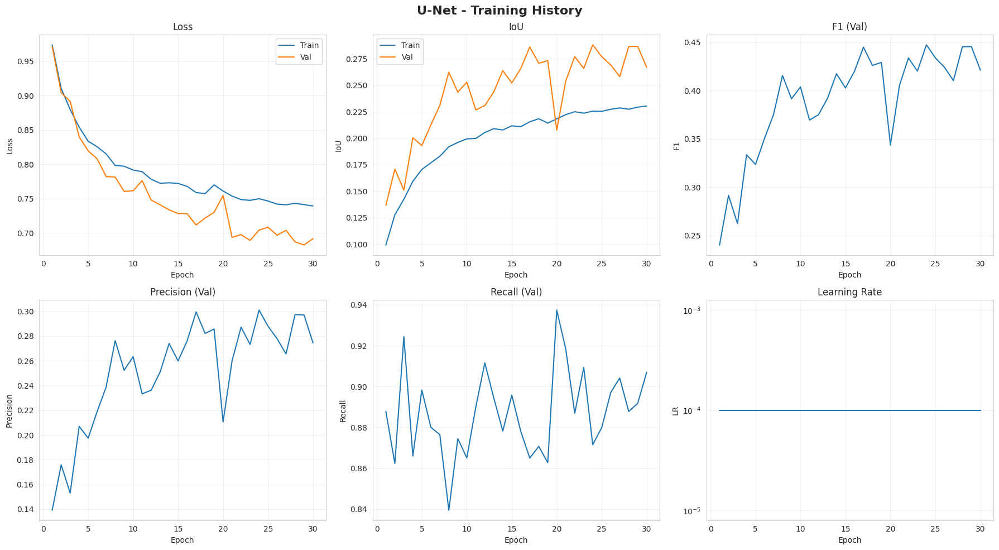


10.2 TRAINING DEEPLABV3+

TRAINING DEEPLABV3+
Device    : cuda
Start time: 2025-12-04 09:44:48

Epoch 1/30
--------------------------------------------------------------------------------


Time: 11.89s
Train Loss: 1.0063 | Train IoU: 0.0858
Val   Loss: 1.0279 | Val   IoU: 0.1118
Val F1: 0.2010, Prec: 0.1127, Rec: 0.9389
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1118)

Epoch 2/30
--------------------------------------------------------------------------------


Time: 11.78s
Train Loss: 0.9432 | Train IoU: 0.1094
Val   Loss: 0.9808 | Val   IoU: 0.1435
Val F1: 0.2510, Prec: 0.1477, Rec: 0.8348
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1435)

Epoch 3/30
--------------------------------------------------------------------------------


Time: 11.83s
Train Loss: 0.9260 | Train IoU: 0.1141
Val   Loss: 0.9648 | Val   IoU: 0.1360
Val F1: 0.2394, Prec: 0.1383, Rec: 0.8907
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 4/30
--------------------------------------------------------------------------------


Time: 11.89s
Train Loss: 0.9091 | Train IoU: 0.1193
Val   Loss: 0.9740 | Val   IoU: 0.1369
Val F1: 0.2408, Prec: 0.1395, Rec: 0.8794
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 5/30
--------------------------------------------------------------------------------


Time: 11.84s
Train Loss: 0.9015 | Train IoU: 0.1218
Val   Loss: 0.9542 | Val   IoU: 0.1400
Val F1: 0.2456, Prec: 0.1423, Rec: 0.8954
LR: 1.00e-04
No improvement for 3 epoch(s)

Epoch 6/30
--------------------------------------------------------------------------------


Time: 11.82s
Train Loss: 0.8948 | Train IoU: 0.1244
Val   Loss: 0.9825 | Val   IoU: 0.1230
Val F1: 0.2190, Prec: 0.1241, Rec: 0.9339
LR: 1.00e-04
No improvement for 4 epoch(s)

Epoch 7/30
--------------------------------------------------------------------------------


Time: 12.12s
Train Loss: 0.8929 | Train IoU: 0.1256
Val   Loss: 0.9539 | Val   IoU: 0.1338
Val F1: 0.2359, Prec: 0.1353, Rec: 0.9217
LR: 1.00e-04
No improvement for 5 epoch(s)

Epoch 8/30
--------------------------------------------------------------------------------


Time: 11.99s
Train Loss: 0.8853 | Train IoU: 0.1265
Val   Loss: 0.9837 | Val   IoU: 0.1236
Val F1: 0.2201, Prec: 0.1246, Rec: 0.9387
LR: 1.00e-04
No improvement for 6 epoch(s)

Epoch 9/30
--------------------------------------------------------------------------------


Time: 11.82s
Train Loss: 0.8846 | Train IoU: 0.1298
Val   Loss: 0.9449 | Val   IoU: 0.1337
Val F1: 0.2358, Prec: 0.1350, Rec: 0.9317
LR: 1.00e-04
No improvement for 7 epoch(s)

Epoch 10/30
--------------------------------------------------------------------------------


Time: 11.71s
Train Loss: 0.8779 | Train IoU: 0.1281
Val   Loss: 0.9351 | Val   IoU: 0.1440
Val F1: 0.2517, Prec: 0.1461, Rec: 0.9065
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1440)

Epoch 11/30
--------------------------------------------------------------------------------


Time: 11.78s
Train Loss: 0.8749 | Train IoU: 0.1314
Val   Loss: 0.9294 | Val   IoU: 0.1484
Val F1: 0.2584, Prec: 0.1510, Rec: 0.8953
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1484)

Epoch 12/30
--------------------------------------------------------------------------------


Time: 11.75s
Train Loss: 0.8699 | Train IoU: 0.1324
Val   Loss: 0.9302 | Val   IoU: 0.1448
Val F1: 0.2530, Prec: 0.1469, Rec: 0.9097
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 13/30
--------------------------------------------------------------------------------


Time: 11.78s
Train Loss: 0.8662 | Train IoU: 0.1353
Val   Loss: 0.9417 | Val   IoU: 0.1661
Val F1: 0.2849, Prec: 0.1720, Rec: 0.8307
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1661)

Epoch 14/30
--------------------------------------------------------------------------------


Time: 11.71s
Train Loss: 0.8613 | Train IoU: 0.1358
Val   Loss: 0.9189 | Val   IoU: 0.1512
Val F1: 0.2627, Prec: 0.1539, Rec: 0.9010
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 15/30
--------------------------------------------------------------------------------


Time: 11.83s
Train Loss: 0.8640 | Train IoU: 0.1367
Val   Loss: 0.9497 | Val   IoU: 0.1573
Val F1: 0.2717, Prec: 0.1610, Rec: 0.8782
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 16/30
--------------------------------------------------------------------------------


Time: 11.82s
Train Loss: 0.8559 | Train IoU: 0.1382
Val   Loss: 0.9278 | Val   IoU: 0.1526
Val F1: 0.2648, Prec: 0.1553, Rec: 0.9019
LR: 1.00e-04
No improvement for 3 epoch(s)

Epoch 17/30
--------------------------------------------------------------------------------


Time: 11.92s
Train Loss: 0.8548 | Train IoU: 0.1375
Val   Loss: 0.9461 | Val   IoU: 0.1318
Val F1: 0.2329, Prec: 0.1329, Rec: 0.9432
LR: 1.00e-04
No improvement for 4 epoch(s)

Epoch 18/30
--------------------------------------------------------------------------------


Time: 11.88s
Train Loss: 0.8497 | Train IoU: 0.1408
Val   Loss: 0.9252 | Val   IoU: 0.1817
Val F1: 0.3074, Prec: 0.1896, Rec: 0.8125
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1817)

Epoch 19/30
--------------------------------------------------------------------------------


Time: 11.92s
Train Loss: 0.8542 | Train IoU: 0.1392
Val   Loss: 0.9109 | Val   IoU: 0.1733
Val F1: 0.2953, Prec: 0.1791, Rec: 0.8473
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 20/30
--------------------------------------------------------------------------------


Time: 11.71s
Train Loss: 0.8463 | Train IoU: 0.1411
Val   Loss: 0.9092 | Val   IoU: 0.1544
Val F1: 0.2676, Prec: 0.1570, Rec: 0.9057
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 21/30
--------------------------------------------------------------------------------


Time: 11.82s
Train Loss: 0.8459 | Train IoU: 0.1416
Val   Loss: 0.9082 | Val   IoU: 0.1616
Val F1: 0.2782, Prec: 0.1651, Rec: 0.8844
LR: 1.00e-04
No improvement for 3 epoch(s)

Epoch 22/30
--------------------------------------------------------------------------------


Time: 11.80s
Train Loss: 0.8442 | Train IoU: 0.1426
Val   Loss: 0.8989 | Val   IoU: 0.1630
Val F1: 0.2803, Prec: 0.1665, Rec: 0.8862
LR: 1.00e-04
No improvement for 4 epoch(s)

Epoch 23/30
--------------------------------------------------------------------------------


Time: 12.05s
Train Loss: 0.8444 | Train IoU: 0.1420
Val   Loss: 0.9106 | Val   IoU: 0.1450
Val F1: 0.2532, Prec: 0.1465, Rec: 0.9323
LR: 1.00e-04
No improvement for 5 epoch(s)

Epoch 24/30
--------------------------------------------------------------------------------


Time: 11.85s
Train Loss: 0.8437 | Train IoU: 0.1418
Val   Loss: 0.8987 | Val   IoU: 0.1640
Val F1: 0.2818, Prec: 0.1676, Rec: 0.8855
LR: 1.00e-04
No improvement for 6 epoch(s)

Epoch 25/30
--------------------------------------------------------------------------------


Time: 11.75s
Train Loss: 0.8394 | Train IoU: 0.1444
Val   Loss: 0.9058 | Val   IoU: 0.1566
Val F1: 0.2708, Prec: 0.1592, Rec: 0.9070
LR: 1.00e-04
No improvement for 7 epoch(s)

Epoch 26/30
--------------------------------------------------------------------------------


Time: 11.77s
Train Loss: 0.8369 | Train IoU: 0.1450
Val   Loss: 0.8986 | Val   IoU: 0.1548
Val F1: 0.2681, Prec: 0.1572, Rec: 0.9125
LR: 1.00e-04
No improvement for 8 epoch(s)

Epoch 27/30
--------------------------------------------------------------------------------


Time: 11.87s
Train Loss: 0.8338 | Train IoU: 0.1444
Val   Loss: 0.8999 | Val   IoU: 0.1561
Val F1: 0.2701, Prec: 0.1586, Rec: 0.9100
LR: 1.00e-04
No improvement for 9 epoch(s)

Epoch 28/30
--------------------------------------------------------------------------------


Time: 11.85s
Train Loss: 0.8333 | Train IoU: 0.1456
Val   Loss: 0.8936 | Val   IoU: 0.1674
Val F1: 0.2867, Prec: 0.1710, Rec: 0.8882
LR: 1.00e-04
No improvement for 10 epoch(s)

Early stopping triggered.

DEEPLABV3+ TRAINING COMPLETE
Best Val IoU: 0.1817


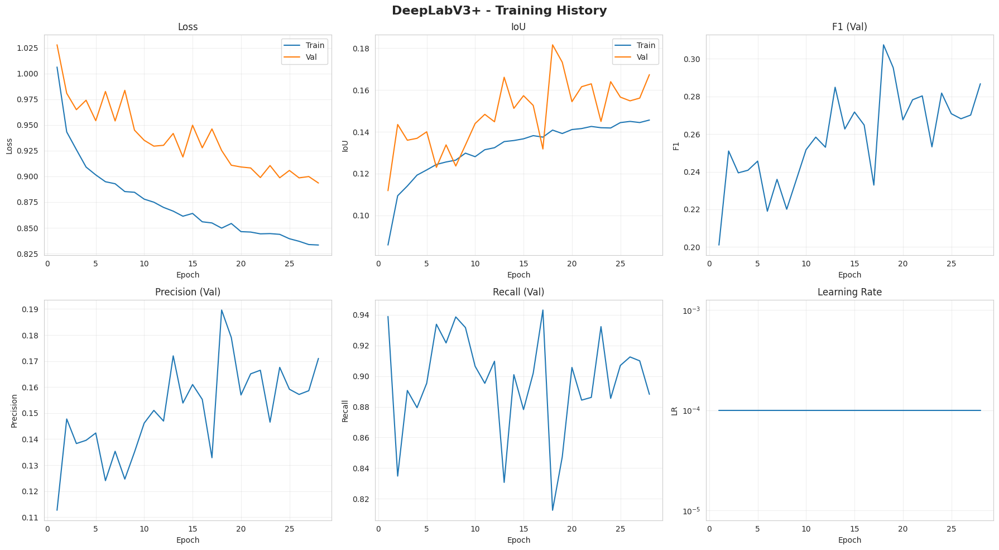


10.3 TRAINING PSPNET

TRAINING PSPNET
Device    : cuda
Start time: 2025-12-04 09:50:24

Epoch 1/30
--------------------------------------------------------------------------------


Time: 11.94s
Train Loss: 1.0516 | Train IoU: 0.0812
Val   Loss: 1.0743 | Val   IoU: 0.1134
Val F1: 0.2036, Prec: 0.1157, Rec: 0.8533
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1134)

Epoch 2/30
--------------------------------------------------------------------------------


Time: 11.69s
Train Loss: 0.9979 | Train IoU: 0.0925
Val   Loss: 1.0638 | Val   IoU: 0.1097
Val F1: 0.1976, Prec: 0.1108, Rec: 0.9218
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 3/30
--------------------------------------------------------------------------------


Time: 11.73s
Train Loss: 0.9794 | Train IoU: 0.0958
Val   Loss: 1.0436 | Val   IoU: 0.1188
Val F1: 0.2124, Prec: 0.1211, Rec: 0.8630
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1188)

Epoch 4/30
--------------------------------------------------------------------------------


Time: 11.70s
Train Loss: 0.9724 | Train IoU: 0.0993
Val   Loss: 1.0346 | Val   IoU: 0.1223
Val F1: 0.2180, Prec: 0.1249, Rec: 0.8550
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1223)

Epoch 5/30
--------------------------------------------------------------------------------


Time: 11.75s
Train Loss: 0.9648 | Train IoU: 0.1001
Val   Loss: 1.0245 | Val   IoU: 0.1194
Val F1: 0.2133, Prec: 0.1211, Rec: 0.8911
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 6/30
--------------------------------------------------------------------------------


Time: 11.65s
Train Loss: 0.9557 | Train IoU: 0.1014
Val   Loss: 1.0249 | Val   IoU: 0.1154
Val F1: 0.2069, Prec: 0.1166, Rec: 0.9169
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 7/30
--------------------------------------------------------------------------------


Time: 11.79s
Train Loss: 0.9520 | Train IoU: 0.1023
Val   Loss: 1.0226 | Val   IoU: 0.1168
Val F1: 0.2091, Prec: 0.1180, Rec: 0.9167
LR: 1.00e-04
No improvement for 3 epoch(s)

Epoch 8/30
--------------------------------------------------------------------------------


Time: 11.72s
Train Loss: 0.9494 | Train IoU: 0.1036
Val   Loss: 1.0174 | Val   IoU: 0.1254
Val F1: 0.2229, Prec: 0.1280, Rec: 0.8623
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1254)

Epoch 9/30
--------------------------------------------------------------------------------


Time: 11.68s
Train Loss: 0.9406 | Train IoU: 0.1070
Val   Loss: 1.0183 | Val   IoU: 0.1260
Val F1: 0.2238, Prec: 0.1286, Rec: 0.8629
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1260)

Epoch 10/30
--------------------------------------------------------------------------------


Time: 11.68s
Train Loss: 0.9377 | Train IoU: 0.1065
Val   Loss: 1.0154 | Val   IoU: 0.1219
Val F1: 0.2172, Prec: 0.1236, Rec: 0.8942
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 11/30
--------------------------------------------------------------------------------


Time: 11.68s
Train Loss: 0.9333 | Train IoU: 0.1078
Val   Loss: 1.0108 | Val   IoU: 0.1236
Val F1: 0.2199, Prec: 0.1255, Rec: 0.8888
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 12/30
--------------------------------------------------------------------------------


Time: 11.82s
Train Loss: 0.9311 | Train IoU: 0.1088
Val   Loss: 1.0151 | Val   IoU: 0.1183
Val F1: 0.2115, Prec: 0.1195, Rec: 0.9183
LR: 1.00e-04
No improvement for 3 epoch(s)

Epoch 13/30
--------------------------------------------------------------------------------


Time: 11.72s
Train Loss: 0.9325 | Train IoU: 0.1091
Val   Loss: 1.0121 | Val   IoU: 0.1181
Val F1: 0.2111, Prec: 0.1192, Rec: 0.9216
LR: 1.00e-04
No improvement for 4 epoch(s)

Epoch 14/30
--------------------------------------------------------------------------------


Time: 11.82s
Train Loss: 0.9280 | Train IoU: 0.1099
Val   Loss: 1.0010 | Val   IoU: 0.1237
Val F1: 0.2201, Prec: 0.1253, Rec: 0.9040
LR: 1.00e-04
No improvement for 5 epoch(s)

Epoch 15/30
--------------------------------------------------------------------------------


Time: 11.78s
Train Loss: 0.9209 | Train IoU: 0.1111
Val   Loss: 0.9931 | Val   IoU: 0.1267
Val F1: 0.2248, Prec: 0.1286, Rec: 0.8927
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1267)

Epoch 16/30
--------------------------------------------------------------------------------


Time: 11.83s
Train Loss: 0.9176 | Train IoU: 0.1122
Val   Loss: 0.9924 | Val   IoU: 0.1261
Val F1: 0.2240, Prec: 0.1280, Rec: 0.8968
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 17/30
--------------------------------------------------------------------------------


Time: 11.92s
Train Loss: 0.9170 | Train IoU: 0.1128
Val   Loss: 0.9959 | Val   IoU: 0.1231
Val F1: 0.2192, Prec: 0.1246, Rec: 0.9115
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 18/30
--------------------------------------------------------------------------------


Time: 11.75s
Train Loss: 0.9184 | Train IoU: 0.1142
Val   Loss: 1.0002 | Val   IoU: 0.1217
Val F1: 0.2169, Prec: 0.1229, Rec: 0.9253
LR: 1.00e-04
No improvement for 3 epoch(s)

Epoch 19/30
--------------------------------------------------------------------------------


Time: 11.82s
Train Loss: 0.9163 | Train IoU: 0.1142
Val   Loss: 0.9977 | Val   IoU: 0.1346
Val F1: 0.2373, Prec: 0.1375, Rec: 0.8636
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1346)

Epoch 20/30
--------------------------------------------------------------------------------


Time: 11.78s
Train Loss: 0.9091 | Train IoU: 0.1154
Val   Loss: 0.9883 | Val   IoU: 0.1302
Val F1: 0.2303, Prec: 0.1323, Rec: 0.8899
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 21/30
--------------------------------------------------------------------------------


Time: 11.92s
Train Loss: 0.9090 | Train IoU: 0.1157
Val   Loss: 0.9934 | Val   IoU: 0.1289
Val F1: 0.2284, Prec: 0.1310, Rec: 0.8895
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 22/30
--------------------------------------------------------------------------------


Time: 11.70s
Train Loss: 0.9068 | Train IoU: 0.1165
Val   Loss: 0.9824 | Val   IoU: 0.1306
Val F1: 0.2311, Prec: 0.1327, Rec: 0.8922
LR: 1.00e-04
No improvement for 3 epoch(s)

Epoch 23/30
--------------------------------------------------------------------------------


Time: 11.77s
Train Loss: 0.9056 | Train IoU: 0.1164
Val   Loss: 0.9816 | Val   IoU: 0.1279
Val F1: 0.2267, Prec: 0.1296, Rec: 0.9062
LR: 1.00e-04
No improvement for 4 epoch(s)

Epoch 24/30
--------------------------------------------------------------------------------


Time: 11.80s
Train Loss: 0.9034 | Train IoU: 0.1171
Val   Loss: 0.9844 | Val   IoU: 0.1350
Val F1: 0.2379, Prec: 0.1376, Rec: 0.8754
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1350)

Epoch 25/30
--------------------------------------------------------------------------------


Time: 11.79s
Train Loss: 0.9046 | Train IoU: 0.1179
Val   Loss: 0.9865 | Val   IoU: 0.1328
Val F1: 0.2344, Prec: 0.1351, Rec: 0.8833
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 26/30
--------------------------------------------------------------------------------


Time: 12.11s
Train Loss: 0.8990 | Train IoU: 0.1194
Val   Loss: 0.9859 | Val   IoU: 0.1237
Val F1: 0.2202, Prec: 0.1250, Rec: 0.9270
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 27/30
--------------------------------------------------------------------------------


Time: 11.91s
Train Loss: 0.9005 | Train IoU: 0.1184
Val   Loss: 0.9876 | Val   IoU: 0.1287
Val F1: 0.2281, Prec: 0.1306, Rec: 0.8987
LR: 1.00e-04
No improvement for 3 epoch(s)

Epoch 28/30
--------------------------------------------------------------------------------


Time: 11.95s
Train Loss: 0.8955 | Train IoU: 0.1194
Val   Loss: 0.9786 | Val   IoU: 0.1311
Val F1: 0.2318, Prec: 0.1331, Rec: 0.8973
LR: 1.00e-04
No improvement for 4 epoch(s)

Epoch 29/30
--------------------------------------------------------------------------------


Time: 11.95s
Train Loss: 0.8954 | Train IoU: 0.1188
Val   Loss: 0.9733 | Val   IoU: 0.1347
Val F1: 0.2374, Prec: 0.1370, Rec: 0.8865
LR: 1.00e-04
No improvement for 5 epoch(s)

Epoch 30/30
--------------------------------------------------------------------------------


Time: 11.72s
Train Loss: 0.8944 | Train IoU: 0.1207
Val   Loss: 0.9800 | Val   IoU: 0.1356
Val F1: 0.2388, Prec: 0.1381, Rec: 0.8795
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1356)

PSPNET TRAINING COMPLETE
Best Val IoU: 0.1356


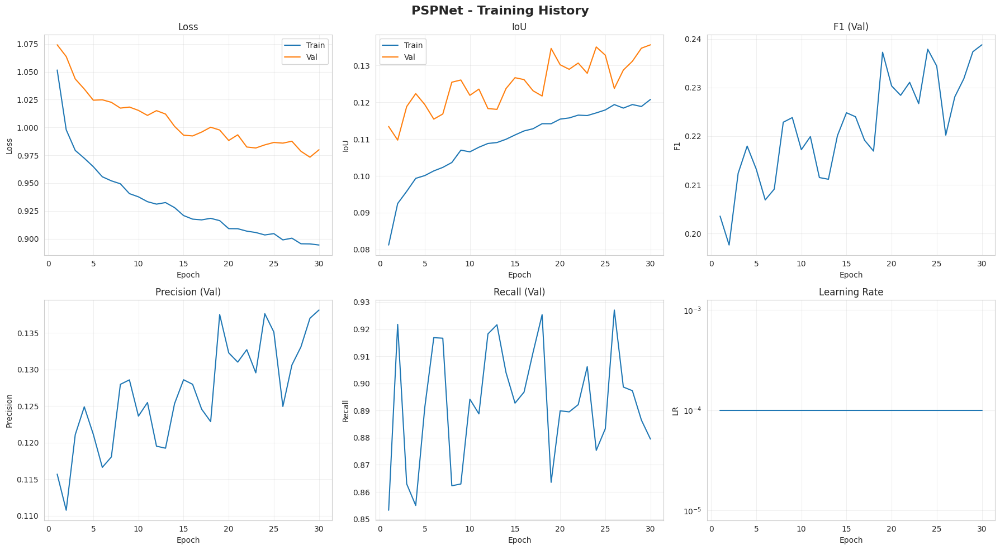


10.4 TRAINING FPN

TRAINING FPN
Device    : cuda
Start time: 2025-12-04 09:56:21

Epoch 1/30
--------------------------------------------------------------------------------


Time: 11.91s
Train Loss: 1.1629 | Train IoU: 0.0714
Val   Loss: 1.0636 | Val   IoU: 0.1109
Val F1: 0.1996, Prec: 0.1127, Rec: 0.8722
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1109)

Epoch 2/30
--------------------------------------------------------------------------------


Time: 12.12s
Train Loss: 1.0458 | Train IoU: 0.0890
Val   Loss: 1.0844 | Val   IoU: 0.1391
Val F1: 0.2442, Prec: 0.1499, Rec: 0.6651
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1391)

Epoch 3/30
--------------------------------------------------------------------------------


Time: 11.84s
Train Loss: 0.9996 | Train IoU: 0.0998
Val   Loss: 1.0055 | Val   IoU: 0.1236
Val F1: 0.2200, Prec: 0.1254, Rec: 0.8956
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 4/30
--------------------------------------------------------------------------------


Time: 11.91s
Train Loss: 0.9688 | Train IoU: 0.1060
Val   Loss: 0.9967 | Val   IoU: 0.1225
Val F1: 0.2182, Prec: 0.1239, Rec: 0.9127
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 5/30
--------------------------------------------------------------------------------


Time: 11.91s
Train Loss: 0.9605 | Train IoU: 0.1083
Val   Loss: 0.9790 | Val   IoU: 0.1335
Val F1: 0.2355, Prec: 0.1360, Rec: 0.8763
LR: 1.00e-04
No improvement for 3 epoch(s)

Epoch 6/30
--------------------------------------------------------------------------------


Time: 11.98s
Train Loss: 0.9404 | Train IoU: 0.1124
Val   Loss: 0.9829 | Val   IoU: 0.1286
Val F1: 0.2278, Prec: 0.1305, Rec: 0.8983
LR: 1.00e-04
No improvement for 4 epoch(s)

Epoch 7/30
--------------------------------------------------------------------------------


Time: 11.90s
Train Loss: 0.9311 | Train IoU: 0.1148
Val   Loss: 0.9743 | Val   IoU: 0.1423
Val F1: 0.2491, Prec: 0.1459, Rec: 0.8541
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1423)

Epoch 8/30
--------------------------------------------------------------------------------


Time: 11.84s
Train Loss: 0.9245 | Train IoU: 0.1176
Val   Loss: 0.9717 | Val   IoU: 0.1492
Val F1: 0.2596, Prec: 0.1538, Rec: 0.8343
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1492)

Epoch 9/30
--------------------------------------------------------------------------------


Time: 11.95s
Train Loss: 0.9181 | Train IoU: 0.1193
Val   Loss: 0.9796 | Val   IoU: 0.1384
Val F1: 0.2431, Prec: 0.1411, Rec: 0.8791
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 10/30
--------------------------------------------------------------------------------


Time: 11.73s
Train Loss: 0.9063 | Train IoU: 0.1227
Val   Loss: 0.9750 | Val   IoU: 0.1441
Val F1: 0.2519, Prec: 0.1478, Rec: 0.8556
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 11/30
--------------------------------------------------------------------------------


Time: 12.04s
Train Loss: 0.9032 | Train IoU: 0.1236
Val   Loss: 0.9517 | Val   IoU: 0.1450
Val F1: 0.2532, Prec: 0.1482, Rec: 0.8722
LR: 1.00e-04
No improvement for 3 epoch(s)

Epoch 12/30
--------------------------------------------------------------------------------


Time: 11.76s
Train Loss: 0.8993 | Train IoU: 0.1242
Val   Loss: 0.9957 | Val   IoU: 0.1290
Val F1: 0.2285, Prec: 0.1303, Rec: 0.9248
LR: 1.00e-04
No improvement for 4 epoch(s)

Epoch 13/30
--------------------------------------------------------------------------------


Time: 11.79s
Train Loss: 0.8949 | Train IoU: 0.1250
Val   Loss: 0.9607 | Val   IoU: 0.1375
Val F1: 0.2417, Prec: 0.1395, Rec: 0.9066
LR: 1.00e-04
No improvement for 5 epoch(s)

Epoch 14/30
--------------------------------------------------------------------------------


Time: 11.96s
Train Loss: 0.8889 | Train IoU: 0.1275
Val   Loss: 0.9435 | Val   IoU: 0.1525
Val F1: 0.2646, Prec: 0.1563, Rec: 0.8602
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1525)

Epoch 15/30
--------------------------------------------------------------------------------


Time: 12.02s
Train Loss: 0.8827 | Train IoU: 0.1287
Val   Loss: 0.9497 | Val   IoU: 0.1507
Val F1: 0.2620, Prec: 0.1542, Rec: 0.8712
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 16/30
--------------------------------------------------------------------------------


Time: 12.08s
Train Loss: 0.8825 | Train IoU: 0.1316
Val   Loss: 0.9389 | Val   IoU: 0.1398
Val F1: 0.2453, Prec: 0.1416, Rec: 0.9167
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 17/30
--------------------------------------------------------------------------------


Time: 11.82s
Train Loss: 0.8789 | Train IoU: 0.1308
Val   Loss: 0.9428 | Val   IoU: 0.1542
Val F1: 0.2672, Prec: 0.1583, Rec: 0.8584
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1542)

Epoch 18/30
--------------------------------------------------------------------------------


Time: 11.84s
Train Loss: 0.8730 | Train IoU: 0.1317
Val   Loss: 0.9312 | Val   IoU: 0.1475
Val F1: 0.2570, Prec: 0.1502, Rec: 0.8898
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 19/30
--------------------------------------------------------------------------------


Time: 11.90s
Train Loss: 0.8669 | Train IoU: 0.1347
Val   Loss: 0.9288 | Val   IoU: 0.1497
Val F1: 0.2604, Prec: 0.1525, Rec: 0.8920
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 20/30
--------------------------------------------------------------------------------


Time: 11.98s
Train Loss: 0.8675 | Train IoU: 0.1351
Val   Loss: 0.9219 | Val   IoU: 0.1545
Val F1: 0.2676, Prec: 0.1577, Rec: 0.8826
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1545)

Epoch 21/30
--------------------------------------------------------------------------------


Time: 11.83s
Train Loss: 0.8642 | Train IoU: 0.1363
Val   Loss: 0.9165 | Val   IoU: 0.1628
Val F1: 0.2799, Prec: 0.1671, Rec: 0.8633
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1628)

Epoch 22/30
--------------------------------------------------------------------------------


Time: 12.11s
Train Loss: 0.8601 | Train IoU: 0.1375
Val   Loss: 0.9215 | Val   IoU: 0.1501
Val F1: 0.2610, Prec: 0.1525, Rec: 0.9037
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 23/30
--------------------------------------------------------------------------------


Time: 11.79s
Train Loss: 0.8564 | Train IoU: 0.1370
Val   Loss: 0.9247 | Val   IoU: 0.1557
Val F1: 0.2694, Prec: 0.1587, Rec: 0.8908
LR: 1.00e-04
No improvement for 2 epoch(s)

Epoch 24/30
--------------------------------------------------------------------------------


Time: 11.73s
Train Loss: 0.8581 | Train IoU: 0.1404
Val   Loss: 0.9228 | Val   IoU: 0.1517
Val F1: 0.2634, Prec: 0.1543, Rec: 0.9012
LR: 1.00e-04
No improvement for 3 epoch(s)

Epoch 25/30
--------------------------------------------------------------------------------


Time: 11.98s
Train Loss: 0.8524 | Train IoU: 0.1392
Val   Loss: 0.9115 | Val   IoU: 0.1609
Val F1: 0.2772, Prec: 0.1646, Rec: 0.8796
LR: 1.00e-04
No improvement for 4 epoch(s)

Epoch 26/30
--------------------------------------------------------------------------------


Time: 11.93s
Train Loss: 0.8483 | Train IoU: 0.1418
Val   Loss: 0.9209 | Val   IoU: 0.1495
Val F1: 0.2601, Prec: 0.1518, Rec: 0.9095
LR: 1.00e-04
No improvement for 5 epoch(s)

Epoch 27/30
--------------------------------------------------------------------------------


Time: 11.79s
Train Loss: 0.8494 | Train IoU: 0.1411
Val   Loss: 0.9056 | Val   IoU: 0.1566
Val F1: 0.2707, Prec: 0.1595, Rec: 0.8960
LR: 1.00e-04
No improvement for 6 epoch(s)

Epoch 28/30
--------------------------------------------------------------------------------


Time: 11.93s
Train Loss: 0.8399 | Train IoU: 0.1429
Val   Loss: 0.9334 | Val   IoU: 0.1819
Val F1: 0.3077, Prec: 0.1904, Rec: 0.8056
LR: 1.00e-04
 New best model saved! (Val IoU: 0.1819)

Epoch 29/30
--------------------------------------------------------------------------------


Time: 11.96s
Train Loss: 0.8383 | Train IoU: 0.1445
Val   Loss: 0.9129 | Val   IoU: 0.1516
Val F1: 0.2633, Prec: 0.1539, Rec: 0.9109
LR: 1.00e-04
No improvement for 1 epoch(s)

Epoch 30/30
--------------------------------------------------------------------------------


Time: 11.86s
Train Loss: 0.8399 | Train IoU: 0.1430
Val   Loss: 0.9369 | Val   IoU: 0.1592
Val F1: 0.2746, Prec: 0.1633, Rec: 0.8647
LR: 1.00e-04
No improvement for 2 epoch(s)

FPN TRAINING COMPLETE
Best Val IoU: 0.1819


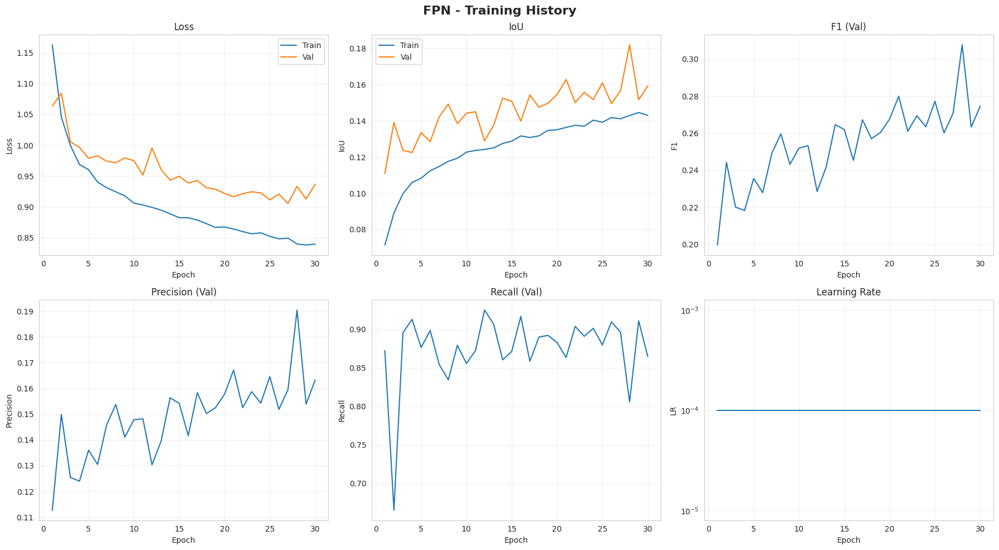

In [ ]:
print("\n" + "="*80)
print("SECTION 10: TRAINING ALL MODELS")
print("="*80)

NUM_EPOCHS          = 30
EARLY_STOP_PATIENCE = 10
LEARNING_RATE       = 1e-4
WEIGHT_DECAY        = 1e-5
CHECKPOINT_DIR      = "/content/checkpoints"

os.makedirs(CHECKPOINT_DIR, exist_ok=True)
print(f"Checkpoints will be saved in: {CHECKPOINT_DIR}")

# ----- U-Net -----
print("\n" + "="*80)
print("10.1 TRAINING U-NET")
print("="*80)
unet_criterion = CombinedLoss(pos_weight=pos_weight.to(device), bce_weight=0.5, dice_weight=0.5)
unet_optimizer = optim.Adam(unet_model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
unet_scheduler = ReduceLROnPlateau(unet_optimizer, mode="min", factor=0.5, patience=5, min_lr=1e-7)

unet_model, unet_history = train_model(
    unet_model, train_loader, val_loader,
    unet_criterion, unet_optimizer, unet_scheduler,
    NUM_EPOCHS, device,
    checkpoint_dir=os.path.join(CHECKPOINT_DIR, "unet"),
    early_stop_patience=EARLY_STOP_PATIENCE,
    model_name="U-Net",
)
plot_training_history(unet_history, model_name="U-Net")


# ----- DeepLabV3+ -----
print("\n" + "="*80)
print("10.2 TRAINING DEEPLABV3+")
print("="*80)
deeplab_criterion = CombinedLoss(pos_weight=pos_weight.to(device), bce_weight=0.5, dice_weight=0.5)
deeplab_optimizer = optim.Adam(deeplab_model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
deeplab_scheduler = ReduceLROnPlateau(deeplab_optimizer, mode="min", factor=0.5, patience=5, min_lr=1e-7)

deeplab_model, deeplab_history = train_model(
    deeplab_model, train_loader, val_loader,
    deeplab_criterion, deeplab_optimizer, deeplab_scheduler,
    NUM_EPOCHS, device,
    checkpoint_dir=os.path.join(CHECKPOINT_DIR, "deeplab"),
    early_stop_patience=EARLY_STOP_PATIENCE,
    model_name="DeepLabV3+",
)
plot_training_history(deeplab_history, model_name="DeepLabV3+")


# ----- PSPNet -----
print("\n" + "="*80)
print("10.3 TRAINING PSPNET")
print("="*80)
pspnet_criterion = CombinedLoss(pos_weight=pos_weight.to(device), bce_weight=0.5, dice_weight=0.5)
pspnet_optimizer = optim.Adam(pspnet_model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
pspnet_scheduler = ReduceLROnPlateau(pspnet_optimizer, mode="min", factor=0.5, patience=5, min_lr=1e-7)

pspnet_model, pspnet_history = train_model(
    pspnet_model, train_loader, val_loader,
    pspnet_criterion, pspnet_optimizer, pspnet_scheduler,
    NUM_EPOCHS, device,
    checkpoint_dir=os.path.join(CHECKPOINT_DIR, "pspnet"),
    early_stop_patience=EARLY_STOP_PATIENCE,
    model_name="PSPNet",
)
plot_training_history(pspnet_history, model_name="PSPNet")


# ----- FPN -----
print("\n" + "="*80)
print("10.4 TRAINING FPN")
print("="*80)
fpn_criterion = CombinedLoss(pos_weight=pos_weight.to(device), bce_weight=0.5, dice_weight=0.5)
fpn_optimizer = optim.Adam(fpn_model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
fpn_scheduler = ReduceLROnPlateau(fpn_optimizer, mode="min", factor=0.5, patience=5, min_lr=1e-7)

fpn_model, fpn_history = train_model(
    fpn_model, train_loader, val_loader,
    fpn_criterion, fpn_optimizer, fpn_scheduler,
    NUM_EPOCHS, device,
    checkpoint_dir=os.path.join(CHECKPOINT_DIR, "fpn"),
    early_stop_patience=EARLY_STOP_PATIENCE,
    model_name="FPN",
)
plot_training_history(fpn_history, model_name="FPN")


# SECTION 11: TEST EVALUATION & TABULAR COMPARISON


In [ ]:
print("\n" + "="*80)
print("SECTION 11: TEST EVALUATION & TABULAR COMPARISON")
print("="*80)

def evaluate_model_comprehensive(model, test_loader, criterion, device, model_name):
    model.eval()
    agg = {"iou": 0.0, "f1": 0.0, "precision": 0.0, "recall": 0.0}
    total_loss = 0.0
    times = []

    with torch.no_grad():
        for imgs, masks in tqdm(test_loader, desc=f"Evaluating {model_name}"):
            imgs = imgs.to(device)
            masks = masks.unsqueeze(1).to(device)

            start = time.time()
            logits = model(imgs)
            dt = time.time() - start
            times.append(dt)

            loss = criterion(logits, masks)
            m = calculate_metrics(logits, masks)

            total_loss += loss.item()
            for k in agg:
                agg[k] += m[k]

    total_loss /= len(test_loader)
    for k in agg:
        agg[k] /= len(test_loader)

    avg_time = float(np.mean(times))
    fps = BATCH_SIZE / avg_time if avg_time > 0 else 0.0

    return {
        "loss": total_loss,
        "metrics": agg,
        "inference_time": avg_time,
        "fps": fps,
    }


models_to_eval = [
    ("U-Net",      unet_model,     unet_criterion,     unet_params),
    ("DeepLabV3+", deeplab_model,  deeplab_criterion,  deeplab_params),
    ("PSPNet",     pspnet_model,   pspnet_criterion,   pspnet_params),
    ("FPN",        fpn_model,      fpn_criterion,      fpn_params),
]

eval_results = {}
rows = []

for name, model, crit, n_params in models_to_eval:
    print(f"\n Evaluating {name} on test set...")
    res = evaluate_model_comprehensive(model, test_loader, crit, device, name)
    eval_results[name] = res

    rows.append([
        name,
        f"{res['metrics']['iou']:.4f}",
        f"{res['metrics']['f1']:.4f}",
        f"{res['metrics']['precision']:.4f}",
        f"{res['metrics']['recall']:.4f}",
        f"{res['inference_time']:.4f}",
        f"{res['fps']:.2f}",
        f"{n_params:,}",
    ])

comparison_df = pd.DataFrame(
    rows,
    columns=[
        "Model", "IoU", "F1 Score", "Precision", "Recall",
        "Inference Time (s)", "FPS", "Parameters",
    ],
)

print("\n" + "="*80)
print("TEST SET RESULTS (ALL MODELS)")
print("="*80)
print(comparison_df.to_string(index=False))

comp_path = os.path.join(CHECKPOINT_DIR, "model_comparison_all_models.csv")
comparison_df.to_csv(comp_path, index=False)
print(f"\n Comparison table saved to: {comp_path}")

# keep old-style names for convenience
unet_results    = eval_results["U-Net"]
deeplab_results = eval_results["DeepLabV3+"]
pspnet_results  = eval_results["PSPNet"]
fpn_results     = eval_results["FPN"]

# Quick "winner" summary
best_by_iou = max(eval_results.items(), key=lambda kv: kv[1]["metrics"]["iou"])[0]
best_by_f1  = max(eval_results.items(), key=lambda kv: kv[1]["metrics"]["f1"])[0]

print("\n BEST MODELS SUMMARY:")
print(f"  Best IoU : {best_by_iou}")
print(f"  Best F1  : {best_by_f1}")



SECTION 11: TEST EVALUATION & TABULAR COMPARISON

 Evaluating U-Net on test set...


Evaluating U-Net: 100%|██████████| 7/7 [00:00<00:00, 10.08it/s]



 Evaluating DeepLabV3+ on test set...


Evaluating DeepLabV3+: 100%|██████████| 7/7 [00:00<00:00, 10.26it/s]



 Evaluating PSPNet on test set...


Evaluating PSPNet: 100%|██████████| 7/7 [00:00<00:00, 10.63it/s]



 Evaluating FPN on test set...


Evaluating FPN: 100%|██████████| 7/7 [00:00<00:00, 10.41it/s]


TEST SET RESULTS (ALL MODELS)
     Model    IoU F1 Score Precision Recall Inference Time (s)     FPS Parameters
     U-Net 0.2882   0.4465    0.2989 0.8897             0.0097  826.60 31,037,633
DeepLabV3+ 0.1821   0.3078    0.1941 0.7481             0.0137  585.71 22,437,457
    PSPNet 0.1347   0.2374    0.1386 0.8276             0.0066 1205.93 21,437,985
       FPN 0.1877   0.3158    0.1986 0.7724             0.0126  634.67 23,155,393

 Comparison table saved to: /content/checkpoints/model_comparison_all_models.csv

 BEST MODELS SUMMARY:
  Best IoU : U-Net
  Best F1  : U-Net


# SECTION 12: INTERACTIVE TESTING (INCLUDING YOLO)


In [ ]:
print("\n" + "="*80)
print("SECTION 12: INTERACTIVE TESTING INTERFACE")
print("="*80)

def predict_on_uploaded_image(model, device, img_size=256, model_name="Model"):
    print("="*80)
    print(f" TESTING {model_name.upper()} (SEMANTIC SEGMENTATION)")
    print("="*80)
    print("\n Please upload an aerial/satellite image:")
    uploaded = files.upload()
    if not uploaded:
        print(" No file uploaded.")
        return None

    filename = list(uploaded.keys())[0]
    print(f"\n Loaded: {filename}")
    image_bytes = uploaded[filename]
    image = Image.open(io.BytesIO(image_bytes)).convert("RGB")
    image_np = np.array(image)
    orig_h, orig_w = image_np.shape[:2]
    print(f"Original size: {orig_w} x {orig_h}")

    transform = A.Compose([
        A.Resize(img_size, img_size),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])
    t = transform(image=image_np)
    img_t = t["image"].unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        start = time.time()
        logits = model(img_t)
        t_inf = time.time() - start
        prob = torch.sigmoid(logits).squeeze().cpu().numpy()
        mask_bin = (prob > 0.5).astype(np.uint8) * 255

    img_disp = img_t.squeeze().cpu().numpy().transpose(1, 2, 0)
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    img_disp = np.clip(std * img_disp + mean, 0, 1)

    road_pixels = (mask_bin > 127).sum()
    total_pixels = mask_bin.size
    road_pct = (road_pixels / total_pixels) * 100

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    axes[0, 0].imshow(image_np)
    axes[0, 0].set_title(f"Original Image ({orig_w}x{orig_h})", fontsize=11, fontweight="bold")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(img_disp)
    axes[0, 1].set_title(f"Model Input ({img_size}x{img_size})", fontsize=11, fontweight="bold")
    axes[0, 1].axis("off")

    im = axes[1, 0].imshow(prob, cmap="hot", vmin=0, vmax=1)
    axes[1, 0].set_title("Road Probability Map", fontsize=11, fontweight="bold")
    axes[1, 0].axis("off")
    plt.colorbar(im, ax=axes[1, 0], fraction=0.046, pad=0.04)

    axes[1, 1].imshow(img_disp)
    axes[1, 1].imshow(mask_bin, cmap="Reds", alpha=0.6)
    axes[1, 1].set_title(f"Overlay (Roads: {road_pct:.2f}%)", fontsize=11, fontweight="bold")
    axes[1, 1].axis("off")

    plt.suptitle(f"{model_name} - Road Segmentation", fontsize=15, fontweight="bold")
    plt.tight_layout()
    plt.show()

    print("\n" + "="*80)
    print(" DETECTION STATS")
    print("="*80)
    print(f"Road coverage: {road_pct:.2f}%")
    print(f"Road pixels  : {road_pixels:,} / {total_pixels:,}")
    print(f"Inference    : {t_inf:.4f} seconds")
    print(f"Speed        : {1.0/max(t_inf,1e-6):.2f} images/sec")
    print("="*80)

    return prob, mask_bin, image_np


def predict_with_yolo_on_uploaded_image(yolo_model, img_size=640):
    if (yolo_model is None) or (not YOLO_AVAILABLE):
        print(" YOLO model not available. Train YOLOv8-Seg and set YOLO_WEIGHTS_PATH.")
        return None

    print("="*80)
    print(" TESTING YOLOv8-SEG (INSTANCE SEGMENTATION)")
    print("="*80)
    print("\n Please upload an image:")
    uploaded = files.upload()
    if not uploaded:
        print(" No file uploaded.")
        return None

    filename = list(uploaded.keys())[0]
    print(f"\n Loaded: {filename}")
    image_bytes = uploaded[filename]
    image = Image.open(io.BytesIO(image_bytes)).convert("RGB")
    image_np = np.array(image)

    results = yolo_model.predict(source=image_np, imgsz=img_size, verbose=False)
    r = results[0]
    if r.masks is None:
        prob_map = np.zeros(image_np.shape[:2], dtype=np.float32)
    else:
        prob_map = r.masks.data.max(dim=0).values.cpu().numpy()

    mask_bin = (prob_map > 0.5).astype(np.uint8) * 255
    road_pixels = (mask_bin > 127).sum()
    total_pixels = mask_bin.size
    road_pct = (road_pixels / total_pixels) * 100

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(image_np)
    axes[0].set_title("Original Image", fontsize=11, fontweight="bold")
    axes[0].axis("off")

    im = axes[1].imshow(prob_map, cmap="hot", vmin=0, vmax=1)
    axes[1].set_title("YOLO Road Probability (Instance Union)", fontsize=11, fontweight="bold")
    axes[1].axis("off")
    plt.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)

    axes[2].imshow(image_np)
    axes[2].imshow(mask_bin, cmap="Reds", alpha=0.6)
    axes[2].set_title(f"YOLO Overlay (Roads: {road_pct:.2f}%)", fontsize=11, fontweight="bold")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

    print("\n" + "="*80)
    print(" YOLO STATS")
    print("="*80)
    print(f"Road coverage: {road_pct:.2f}%")
    print(f"Road pixels  : {road_pixels:,} / {total_pixels:,}")
    print("="*80)

    return prob_map, mask_bin, image_np


def compare_all_models_on_upload(
    unet_model,
    deeplab_model,
    pspnet_model,
    fpn_model,
    yolo_model,
    device,
    img_size=256,
    yolo_img_size=640,
):
    print("="*80)
    print(" FULL MODEL COMPARISON (U-Net / DeepLabV3+ / PSPNet / FPN / YOLO)")
    print("="*80)
    print("\n📤 Upload an image:")
    uploaded = files.upload()
    if not uploaded:
        print(" No file uploaded.")
        return None

    filename = list(uploaded.keys())[0]
    image_bytes = uploaded[filename]
    image = Image.open(io.BytesIO(image_bytes)).convert("RGB")
    image_np = np.array(image)

    base_tf = A.Compose([
        A.Resize(img_size, img_size),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])
    t = base_tf(image=image_np)
    img_t = t["image"].unsqueeze(0).to(device)

    img_disp = img_t.squeeze().cpu().numpy().transpose(1, 2, 0)
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    img_disp = np.clip(std * img_disp + mean, 0, 1)

    enc_models = [
        ("U-Net",      unet_model),
        ("DeepLabV3+", deeplab_model),
        ("PSPNet",     pspnet_model),
        ("FPN",        fpn_model),
    ]

    preds_bin = {}
    coverages = {}
    times = {}

    for name, model in enc_models:
        model.eval()
        with torch.no_grad():
            start = time.time()
            logits = model(img_t)
            dt = time.time() - start
            prob = torch.sigmoid(logits).squeeze().cpu().numpy()
            mask_bin = (prob > 0.5).astype(np.uint8) * 255

        cov = ((mask_bin > 127).sum() / mask_bin.size) * 100
        preds_bin[name] = mask_bin
        coverages[name] = cov
        times[name] = dt

    if (yolo_model is not None) and YOLO_AVAILABLE:
        results = yolo_model.predict(source=image_np, imgsz=yolo_img_size, verbose=False)
        r = results[0]
        if r.masks is None:
            yolo_prob = np.zeros(image_np.shape[:2], dtype=np.float32)
        else:
            yolo_prob = r.masks.data.max(dim=0).values.cpu().numpy()
        yolo_bin = (yolo_prob > 0.5).astype(np.uint8) * 255
        yolo_cov = ((yolo_bin > 127).sum() / yolo_bin.size) * 100
    else:
        yolo_bin, yolo_cov = None, None

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes[0, 0].imshow(image_np)
    axes[0, 0].set_title("Original", fontsize=11, fontweight="bold")
    axes[0, 0].axis("off")

    def show(ax, name):
        ax.imshow(img_disp)
        ax.imshow(preds_bin[name], cmap="Reds", alpha=0.6)
        ax.set_title(f"{name}\nRoads: {coverages[name]:.2f}% | {times[name]:.3f}s",
                     fontsize=11, fontweight="bold")
        ax.axis("off")

    show(axes[0, 1], "U-Net")
    show(axes[0, 2], "DeepLabV3+")
    show(axes[1, 0], "PSPNet")
    show(axes[1, 1], "FPN")

    if yolo_bin is not None:
        axes[1, 2].imshow(image_np)
        axes[1, 2].imshow(yolo_bin, cmap="Reds", alpha=0.6)
        axes[1, 2].set_title(f"YOLOv8-Seg\nRoads: {yolo_cov:.2f}%", fontsize=11, fontweight="bold")
        axes[1, 2].axis("off")
    else:
        axes[1, 2].axis("off")
        axes[1, 2].set_title("YOLOv8-Seg (not available)", fontsize=11, fontweight="bold")

    plt.suptitle("Model Comparison", fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.show()

    print("\n" + "="*80)
    print(" FULL COMPARISON SUMMARY")
    print("="*80)
    for name, _ in enc_models:
        print(f"{name}: Roads={coverages[name]:.2f}%, Time={times[name]:.4f}s, "
              f"Speed={1.0/max(times[name],1e-6):.2f} img/s")
    if yolo_cov is not None:
        print(f"YOLOv8-Seg: Roads={yolo_cov:.2f}%")
    print("="*80)


def batch_test_multiple_images(model, device, img_size=256, model_name="Model"):
    print("="*80)
    print(f" BATCH TESTING - {model_name.upper()}")
    print("="*80)
    print("\n Upload multiple images:")
    uploaded = files.upload()
    if not uploaded:
        print(" No files uploaded.")
        return

    n = len(uploaded)
    print(f"\nLoaded {n} images.")
    fig, axes = plt.subplots(n, 3, figsize=(15, 5 * n))
    if n == 1:
        axes = axes.reshape(1, -1)

    model.eval()
    results = []

    tfm = A.Compose([
        A.Resize(img_size, img_size),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])

    with torch.no_grad():
        for idx, (fname, data_bytes) in enumerate(uploaded.items()):
            img = Image.open(io.BytesIO(data_bytes)).convert("RGB")
            img_np = np.array(img)

            t = tfm(image=img_np)
            img_t = t["image"].unsqueeze(0).to(device)

            start = time.time()
            logits = model(img_t)
            dt = time.time() - start
            prob = torch.sigmoid(logits).squeeze().cpu().numpy()
            mask_bin = (prob > 0.5).astype(np.uint8) * 255

            road_pct = ((mask_bin > 127).sum() / mask_bin.size) * 100

            img_disp = img_t.squeeze().cpu().numpy().transpose(1, 2, 0)
            mean = np.array([0.485, 0.456, 0.406])
            std  = np.array([0.229, 0.224, 0.225])
            img_disp = np.clip(std * img_disp + mean, 0, 1)

            results.append({
                "filename": fname,
                "road_pct": road_pct,
                "inference_time": dt,
            })

            axes[idx, 0].imshow(img_np)
            axes[idx, 0].set_title(fname[:30], fontsize=10, fontweight="bold")
            axes[idx, 0].axis("off")

            axes[idx, 1].imshow(prob, cmap="hot", vmin=0, vmax=1)
            axes[idx, 1].set_title("Probability", fontsize=10, fontweight="bold")
            axes[idx, 1].axis("off")

            axes[idx, 2].imshow(img_disp)
            axes[idx, 2].imshow(mask_bin, cmap="Reds", alpha=0.6)
            axes[idx, 2].set_title(f"Roads {road_pct:.1f}% | {dt:.3f}s",
                                   fontsize=10, fontweight="bold")
            axes[idx, 2].axis("off")

    plt.suptitle(f"{model_name} - Batch Results", fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.show()

    print("\n" + "="*80)
    print(" BATCH SUMMARY")
    print("="*80)
    for i, r in enumerate(results, 1):
        print(f"{i}. {r['filename']}: Roads={r['road_pct']:.2f}%, "
              f"Time={r['inference_time']:.4f}s, Speed={1.0/max(r['inference_time'],1e-6):.2f} img/s")
    avg_time = np.mean([r["inference_time"] for r in results])
    print(f"\nAverage time: {avg_time:.4f}s ({1.0/max(avg_time,1e-6):.2f} img/s)")
    print("="*80)

    return results


print(" Interactive testing utilities ready.")


SECTION 12: INTERACTIVE TESTING INTERFACE
 Interactive testing utilities ready.


# MASTER COMPARISON: Predict Using All Models


 FULL MODEL COMPARISON (U-Net / DeepLabV3+ / PSPNet / FPN / YOLO)

📤 Upload an image:


Saving maxres_satellite_maps_top_section_315aeb262d.webp to maxres_satellite_maps_top_section_315aeb262d.webp


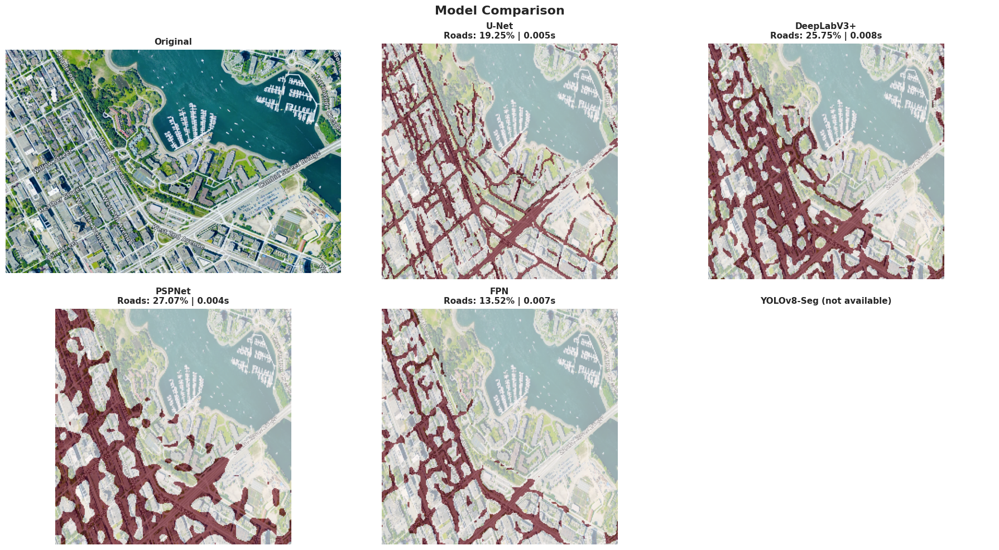


 FULL COMPARISON SUMMARY
U-Net: Roads=19.25%, Time=0.0047s, Speed=211.18 img/s
DeepLabV3+: Roads=25.75%, Time=0.0075s, Speed=133.00 img/s
PSPNet: Roads=27.07%, Time=0.0037s, Speed=270.51 img/s
FPN: Roads=13.52%, Time=0.0070s, Speed=142.97 img/s


In [ ]:
compare_all_models_on_upload(
    unet_model=unet_model,
    deeplab_model=deeplab_model,
    pspnet_model=pspnet_model,
    fpn_model=fpn_model,
    yolo_model=yolo_model,    # can be None if you didn’t train YOLO
    device=device,
    img_size=256,
    yolo_img_size=640
)


# SECTION 13: VISUALIZATION ON TEST SET



SECTION 13: VISUALIZATION ON TEST SET

 U-Net predictions on test set:


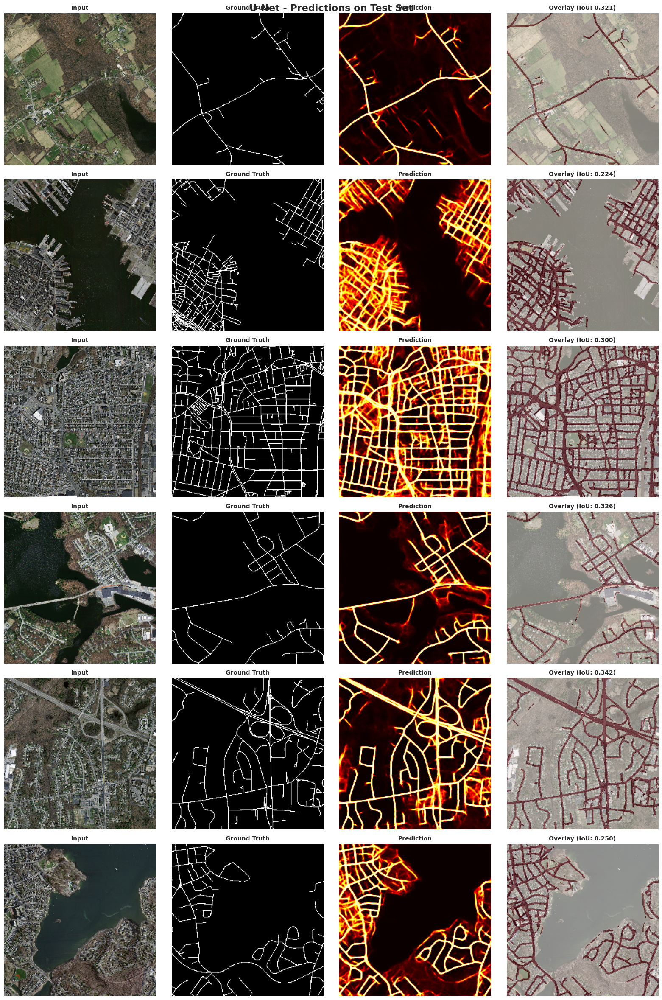


 DeepLabV3+ predictions on test set:


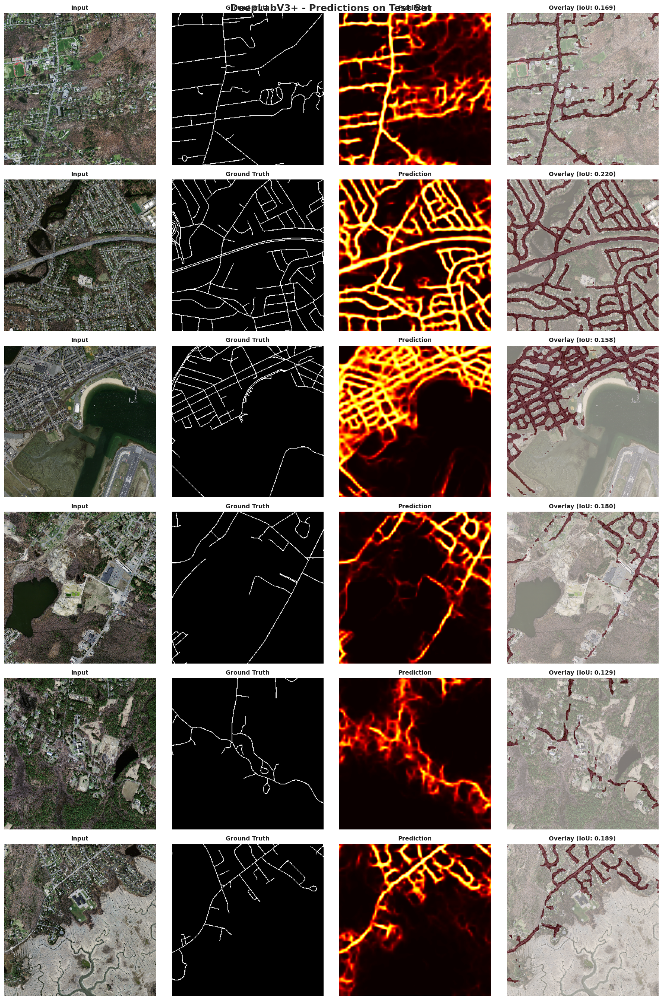

In [ ]:
print("\n" + "="*80)
print("SECTION 13: VISUALIZATION ON TEST SET")
print("="*80)

def visualize_predictions(model, dataset, device, n_samples=6, model_name="Model"):
    model.eval()
    idxs = np.random.choice(len(dataset), min(n_samples, len(dataset)), replace=False)
    fig, axes = plt.subplots(len(idxs), 4, figsize=(16, 4 * len(idxs)))
    if len(idxs) == 1:
        axes = axes.reshape(1, -1)

    with torch.no_grad():
        for row, idx in enumerate(idxs):
            img, mask = dataset[idx]
            img_t = img.unsqueeze(0).to(device)
            logits = model(img_t)
            prob = torch.sigmoid(logits).squeeze().cpu().numpy()
            pred_bin = (prob > 0.5).astype(np.float32)

            img_np = img.permute(1, 2, 0).numpy()
            mean = np.array([0.485, 0.456, 0.406])
            std  = np.array([0.229, 0.224, 0.225])
            img_np = np.clip(std * img_np + mean, 0, 1)
            mask_np = mask.numpy()

            intersection = (pred_bin * mask_np).sum()
            union = pred_bin.sum() + mask_np.sum() - intersection
            iou = intersection / (union + 1e-6)

            axes[row, 0].imshow(img_np)
            axes[row, 0].set_title("Input", fontsize=10, fontweight="bold")
            axes[row, 0].axis("off")

            axes[row, 1].imshow(mask_np, cmap="gray")
            axes[row, 1].set_title("Ground Truth", fontsize=10, fontweight="bold")
            axes[row, 1].axis("off")

            axes[row, 2].imshow(prob, cmap="hot", vmin=0, vmax=1)
            axes[row, 2].set_title("Prediction", fontsize=10, fontweight="bold")
            axes[row, 2].axis("off")

            axes[row, 3].imshow(img_np)
            axes[row, 3].imshow(pred_bin, cmap="Reds", alpha=0.5)
            axes[row, 3].set_title(f"Overlay (IoU: {iou:.3f})", fontsize=10, fontweight="bold")
            axes[row, 3].axis("off")

    plt.suptitle(f"{model_name} - Predictions on Test Set", fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.show()


print("\n U-Net predictions on test set:")
visualize_predictions(unet_model, test_dataset, device, n_samples=6, model_name="U-Net")

print("\n DeepLabV3+ predictions on test set:")
visualize_predictions(deeplab_model, test_dataset, device, n_samples=6, model_name="DeepLabV3+")



# SECTION 14: FINAL RESULTS SUMMARY EXPORT


In [ ]:
print("\n" + "="*80)
print("SECTION 14: FINAL RESULTS SUMMARY EXPORT")
print("="*80)

results_summary = f"""
{'='*80}
ROAD SEGMENTATION PROJECT - FINAL RESULTS SUMMARY
{'='*80}

Author     : Sairam Jammu
Dataset    : Massachusetts Roads Dataset
Date       : {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}

TRAINING CONFIG:
  Image Size        : {IMG_SIZE} x {IMG_SIZE}
  Batch Size        : {BATCH_SIZE}
  Max Epochs        : {NUM_EPOCHS}
  Learning Rate     : {LEARNING_RATE}
  Early Stop Patience: {EARLY_STOP_PATIENCE}

DATASET:
  Train Samples     : {len(train_dataset)}
  Validation Samples: {len(val_dataset)}
  Test Samples      : {len(test_dataset)}
  Estimated Road Coverage: {road_ratio*100:.2f}% (train subset)
  Class Imbalance Ratio   : 1 : {non_road_ratio/road_ratio:.2f}

TEST RESULTS (IoU, F1, Precision, Recall, FPS):

{comparison_df.to_string(index=False)}

BEST MODELS:
  Best IoU : {best_by_iou}
  Best F1  : {best_by_f1}

Checkpoints saved in:
  {CHECKPOINT_DIR}

{'='*80}
"""

summary_path = os.path.join(CHECKPOINT_DIR, "final_results_summary.txt")
with open(summary_path, "w") as f:
    f.write(results_summary)

print(results_summary)
print(f"\n Final summary saved to: {summary_path}")

print("\n END OF CODE ")


SECTION 14: FINAL RESULTS SUMMARY EXPORT

ROAD SEGMENTATION PROJECT - FINAL RESULTS SUMMARY

Author     : Sairam Jammu
Dataset    : Massachusetts Roads Dataset
Date       : 2025-12-04 10:03:35

TRAINING CONFIG:
  Image Size        : 256 x 256
  Batch Size        : 8
  Max Epochs        : 30
  Learning Rate     : 0.0001
  Early Stop Patience: 10

DATASET:
  Train Samples     : 1108
  Validation Samples: 14
  Test Samples      : 49
  Estimated Road Coverage: 4.74% (train subset)
  Class Imbalance Ratio   : 1 : 20.08

TEST RESULTS (IoU, F1, Precision, Recall, FPS):

     Model    IoU F1 Score Precision Recall Inference Time (s)     FPS Parameters
     U-Net 0.2882   0.4465    0.2989 0.8897             0.0097  826.60 31,037,633
DeepLabV3+ 0.1821   0.3078    0.1941 0.7481             0.0137  585.71 22,437,457
    PSPNet 0.1347   0.2374    0.1386 0.8276             0.0066 1205.93 21,437,985
       FPN 0.1877   0.3158    0.1986 0.7724             0.0126  634.67 23,155,393

BEST MODELS:
  Bes